In [1]:
#!unzip  "/content/drive/MyDrive/images-classification/Dataset+projet+prétraitement+textes+images.zip" -d "/content/drive/MyDrive/images-classification"

In [2]:
#pip install tensorflow

In [3]:
#to save images in GitHb
!pip install kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 18.8 MB/s eta 0:00:00


In [4]:
pip install matplotlib

In [5]:
# import packages

import numpy as np
import matplotlib.pyplot as plt

from os import listdir
from imageio import imread
from sklearn.feature_extraction.image import extract_patches_2d
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from joblib import Parallel, delayed
from skimage import feature

# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
import cv2 #swift
import matplotlib.pyplot as plt
import numpy as np
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# check for GPU availability
print("GPU", "available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.12.0
TF Hub version: 0.14.0
GPU not available :(


In [6]:
# Checkout the labels of our data
import pandas as pd
data = pd.read_csv("/content/drive/MyDrive/images-classification/Flipkart/flipkart_com-ecommerce_sample_1050.csv")

In [7]:
from IPython.display import Image
import os
import glob

img = [cv2.imread(file) for file in glob.glob("/content/drive/MyDrive/images-classification/Flipkart/Images/*.jpg")]
len(img)

1050

In [8]:
from IPython.display import Image

images_list =[Image(file) for file in glob.glob("/content/drive/MyDrive/images-classification/Flipkart/Images/*.jpg")]
len(images_list)

1050

In [9]:
data.shape

(1050, 15)

In [10]:
# visualize the first 5 rows
data.sample(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
670,d06bb04b096c77dc3302eaf2db336f96,2015-12-31 09:19:31 +0000,http://www.flipkart.com/mh-mdf-photo-frame/p/i...,MH MDF Photo Frame,"[""Baby Care >> Baby & Kids Gifts >> Photo Fram...",PHFEE9ZQGBXX5NYY,999.0,899.0,d06bb04b096c77dc3302eaf2db336f96.jpg,False,Buy MH MDF Photo Frame for Rs.899 online. MH M...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Stand Mate..."
485,44b963eb856b4831dfdd21b666593c95,2016-01-07 05:50:25 +0000,http://www.flipkart.com/lapguard-lenovo-ideapa...,Lapguard Lenovo IdeaPad V470 6 Cell Laptop Bat...,"[""Computers >> Laptop Accessories >> Batteries...",ACCDVPGKY3GBDB5P,3999.0,1799.0,44b963eb856b4831dfdd21b666593c95.jpg,False,Lapguard Lenovo IdeaPad V470 6 Cell Laptop Bat...,2,2,Lapguard,"{""product_specification""=>[{""key""=>""In The Box..."
113,0ddc40c08d9a9bafc4d14eddd98db7c0,2016-04-23 02:17:20 +0000,http://www.flipkart.com/omic-poto-blue-1000-ml...,Omic Poto-Blue 1000 ml Sipper,"[""Kitchen & Dining >> Containers & Bottles >> ...",BOTEEMN6NM57HSBU,999.0,549.0,0ddc40c08d9a9bafc4d14eddd98db7c0.jpg,False,Key Features of Omic Poto-Blue 1000 ml Sipper ...,3.8,3.8,Omic,"{""product_specification""=>[{""key""=>""Body Mater..."
24,653826cd53f1d9e2c086c0ac7846ef70,2015-12-04 07:25:36 +0000,http://www.flipkart.com/fastrack-38015pl01-ana...,"fastrack 38015PL01 Analog Watch - For Men, Boys","[""Watches >> Wrist Watches >> fastrack Wrist W...",WATE9WKSHRYTM2PP,2495.0,2495.0,653826cd53f1d9e2c086c0ac7846ef70.jpg,False,"fastrack 38015PL01 Analog Watch - For Men, Bo...",No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
1022,7ec5ac2dea80b6c5e4cfd20eba597d20,2016-03-03 06:06:42 +0000,http://www.flipkart.com/aroma-comfort-polyeste...,Aroma Comfort Polyester Brown Floral Eyelet Lo...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEFQF6GZF9ZCZQ,699.0,599.0,7ec5ac2dea80b6c5e4cfd20eba597d20.jpg,False,Key Features of Aroma Comfort Polyester Brown ...,No rating available,No rating available,Aroma Comfort,"{""product_specification""=>[{""key""=>""Brand"", ""v..."


In [11]:
# check missing values

data.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

<Axes: >

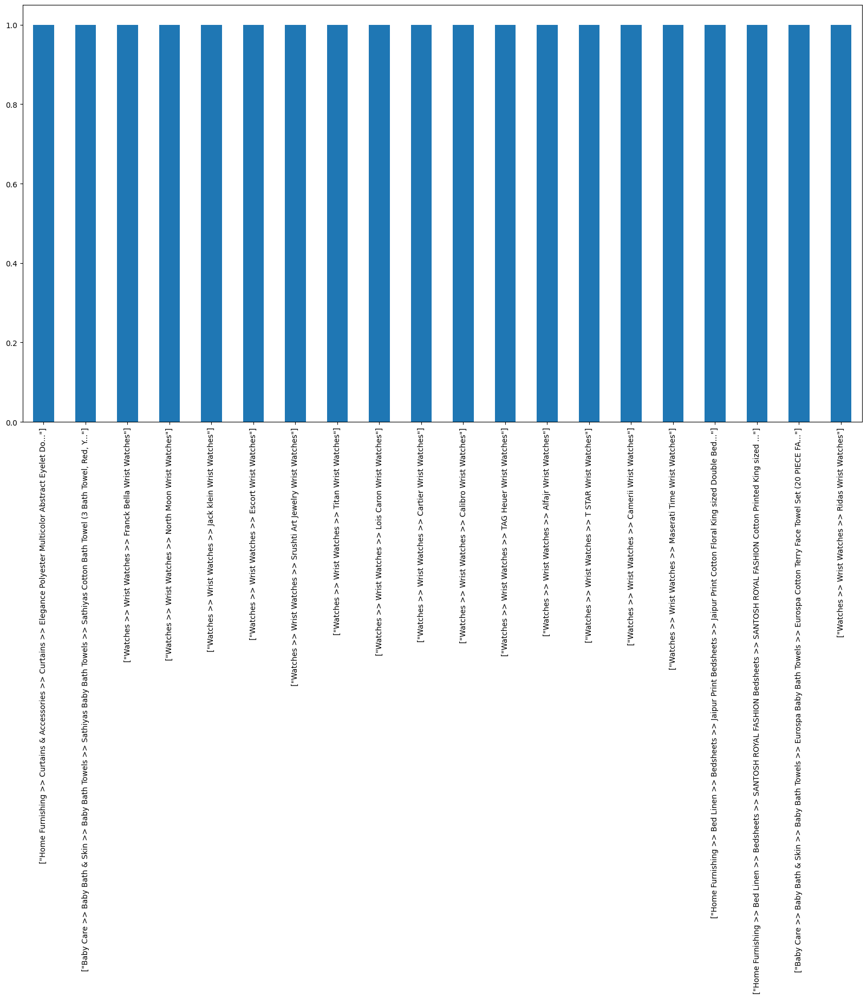

In [12]:
# Visualise the Product name column, 1st products
data["product_category_tree"][:20].value_counts().plot.bar(figsize=(20,10))

In [13]:
data['product_category_tree'].nunique()

642

In [14]:
#Treatment of categories
def split_categories(category, level):
    '''Fonction qui affiche les '''
    category = category.split('["')[1].split('"]')[0]
    cat = category.split(' >> ')
    if(len(cat)) < 3:
        cat = [cat[0], cat[1], 'None']
        if(len(cat))<2:
            cat = [cat[0], 'None', 'None']
    return cat[level]

def split_categories_1(category):
    return split_categories(category,0)
def split_categories_2(category):
    return split_categories(category,1)
def split_categories_3(category):
    return split_categories(category,2)

def detail_categories(dataframe):
    dataframe['cat_lvl_1'] = dataframe['product_category_tree'].apply(split_categories_1)
    dataframe['cat_lvl_2'] = dataframe['product_category_tree'].apply(split_categories_2)
    dataframe['cat_lvl_3'] = dataframe['product_category_tree'].apply(split_categories_3)
    return dataframe.drop(['product_category_tree'], axis=1)

In [15]:
data = detail_categories(data)

In [16]:
data.head(5)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets


In [17]:
# groupby cat_lvl_1
data.groupby('cat_lvl_1').count()['uniq_id'].sort_values(ascending=False)

cat_lvl_1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: uniq_id, dtype: int64

In [18]:
# groupby cat_lvl_2
data.groupby('cat_lvl_2').count()['uniq_id'].sort_values(ascending=False)

cat_lvl_2
Wrist Watches                149
Laptop Accessories            87
Infant Wear                   84
Coffee Mugs                   74
Showpieces                    71
                            ... 
Dinnerware & Crockery          1
Men's Grooming                 1
Beauty Accessories             1
Kripa's Home Furnishing        1
Consumables & Disposables      1
Name: uniq_id, Length: 62, dtype: int64

In [19]:
# groupby cat_lvl_3
data.groupby('cat_lvl_3').count()['uniq_id'].sort_values(ascending=False)

cat_lvl_3
Deodorants                   65
Blankets, Quilts & Dohars    57
Baby Girls' Clothes          49
Routers                      49
USB Gadgets                  38
                             ..
Makeup Accessories            1
Malhar Showpieces             1
Mars Combos and Kits          1
Marvel Wrist Watches          1
posterchacha Coffee Mugs      1
Name: uniq_id, Length: 242, dtype: int64

<Axes: >

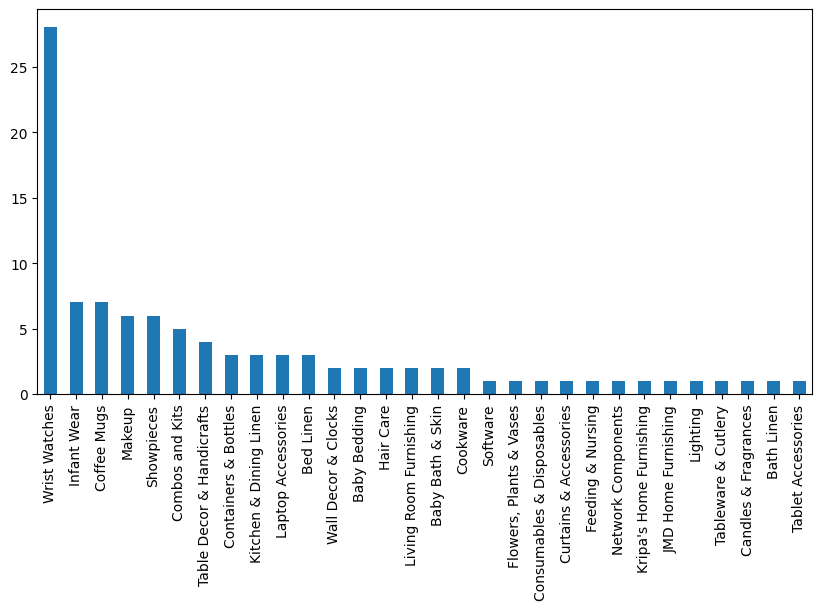

In [20]:
# Visualise the Product name column, 1st products
data["cat_lvl_2"][:100].value_counts().plot.bar(figsize=(10,5))

In [21]:
data.to_csv('saved_data_categories.csv',sep=',',index = True)

In [22]:
#Identification of the category's with less values
less_cat = pd.DataFrame(data['cat_lvl_1'].value_counts())

## Création des labels des photos à partir du nom des images

In [23]:
# path = "/content/drive/MyDrive/images-classification/Flipkart/flipkart_com-ecommerce_sample_1050.csv"
path_to_directory = "/content/drive/MyDrive/images-classification/Flipkart/Images"
list_photos = [file for file in listdir(path_to_directory)]
print(len(list_photos))

1050


In [24]:
from sklearn import preprocessing

list_labels = ["Baby Care", "Beauty and Personal Care", "Computers", "Home Decor & Festive Needs", "Home Furnishing", "Kitchen & Dining", "Watches"]
label_name = "no_name "

def photo_class(photo) :
    for label in list_labels :
        if label in photo:
            return label
    return label_name

data_labels = pd.DataFrame()
data_labels["image_path"] = list_photos
data_labels["label_name"] = data_labels["image_path"].apply(lambda x : photo_class(x))
le = preprocessing.LabelEncoder()
data_labels["label"] = le.fit_transform(data["cat_lvl_1"])
data_labels

,image_path,label_name,label
0,69446af66066146718cd569f87e99fff.jpg,no_name,4
1,f01140c02fd09e5c56312a64fa8db3da.jpg,no_name,0
2,b4d35b6536b623c83b293eb3a1c02bba.jpg,no_name,0
3,6329ddb46087cb8c09ced95471dd9643.jpg,no_name,4
4,e2ae2af58ac50adf4881751ae84a9d8a.jpg,no_name,4
...,...,...,...
1045,493d1eb6ad7a48a926092bf994cd0bb0.jpg,no_name,0
1046,3388d05e88972ff9f3e1321dc0cfdc28.jpg,no_name,0
1047,d1899ab1d5c79ddaa311bc9f04d198ed.jpg,no_name,0
1048,e7cab08a267e815c72a26513222783e0.jpg,no_name,0


# Data engineering

In [25]:
from sklearn.model_selection import train_test_split

In [26]:
train, test = train_test_split(data.sample(100, random_state=42), test_size = 0.25, random_state=42)
train, test = train_test_split(data, test_size = 0.25, random_state=42)

In [27]:
train.to_csv('data_train.csv')
test.to_csv('data_test.csv')

# Traitement des Images

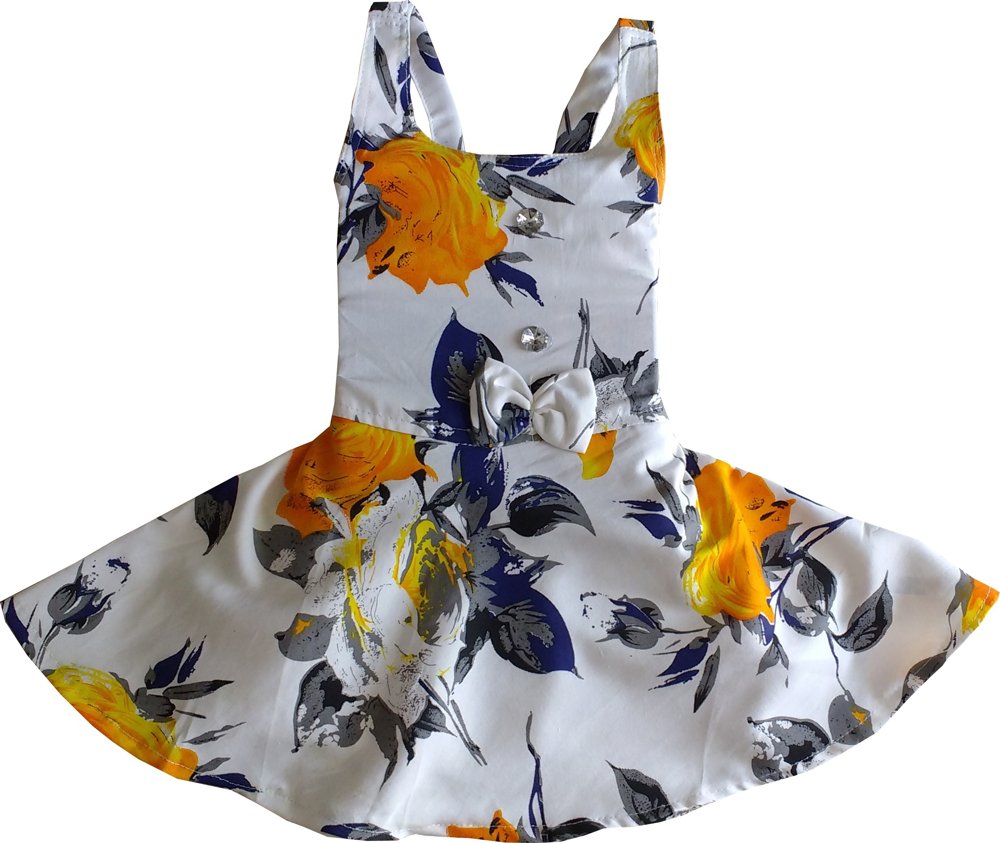

In [28]:
from IPython.display import Image
Image('/content/drive/MyDrive/images-classification/Flipkart/Images/'+ str(data.sample(1)['image'].values.tolist()[0]), width=100 )

In [29]:
#Sample of the data
img_sample = data.sample(1050, random_state=42)
img_sample.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
352,833a87b0af3b84fe246d2ebf271af177,2015-12-01 06:13:00 +0000,http://www.flipkart.com/zyxel-pla-4205/p/itmdy...,Zyxel PLA-4205,RTRDYZYDXGHXXJNZ,10999.0,8100.0,833a87b0af3b84fe246d2ebf271af177.jpg,False,Buy Zyxel PLA-4205 only for Rs. 8100 from Flip...,No rating available,No rating available,Zyxel,"{""product_specification""=>[{""key""=>""In The Box...",Computers,Network Components,Routers
689,55195de3873fffaa9e37b041533d7305,2015-12-31 09:19:31 +0000,http://www.flipkart.com/philips-9-5-w-led-b22-...,Philips 9.5 W LED B22 3000K A55 IND Bulb,BLBEF3HEKYURWHKG,699.0,419.0,55195de3873fffaa9e37b041533d7305.jpg,False,Buy Philips 9.5 W LED B22 3000K A55 IND Bulb f...,No rating available,No rating available,Philips,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Kitchen & Dining,Lighting,Bulbs
485,44b963eb856b4831dfdd21b666593c95,2016-01-07 05:50:25 +0000,http://www.flipkart.com/lapguard-lenovo-ideapa...,Lapguard Lenovo IdeaPad V470 6 Cell Laptop Bat...,ACCDVPGKY3GBDB5P,3999.0,1799.0,44b963eb856b4831dfdd21b666593c95.jpg,False,Lapguard Lenovo IdeaPad V470 6 Cell Laptop Bat...,2,2,Lapguard,"{""product_specification""=>[{""key""=>""In The Box...",Computers,Laptop Accessories,Batteries
388,98ad5b99ad96695568d8f143b11ab740,2015-12-01 06:13:00 +0000,http://www.flipkart.com/anna-andre-paris-set-d...,Anna Andre Paris Set of Dark Fire & Numero 1 D...,CAGEYUXVZSFVZRHE,355.0,310.0,98ad5b99ad96695568d8f143b11ab740.jpg,False,Flipkart.com: Buy Anna Andre Paris Set of Dark...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Number of ...",Beauty and Personal Care,Fragrances,Deodorants
31,29b1ca231e10d5269516b80bf9d0dffc,2015-12-04 07:25:36 +0000,http://www.flipkart.com/lenco-bdblue-tango-ana...,"Lenco Bdblue Tango Analog Watch - For Men, Boys",WATEB2FZUMQU4W7R,1499.0,599.0,29b1ca231e10d5269516b80bf9d0dffc.jpg,False,"Lenco Bdblue Tango Analog Watch - For Men, Bo...",No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp...",Watches,Wrist Watches,Lenco Wrist Watches


In [30]:
img_sample['image'] = img_sample['image'].apply(lambda x: '/content/drive/MyDrive/images-classification/Flipkart/Images/'+str(x))

In [31]:
img_sample['image'].head(1)

352    /content/drive/MyDrive/images-classification/F...
Name: image, dtype: object

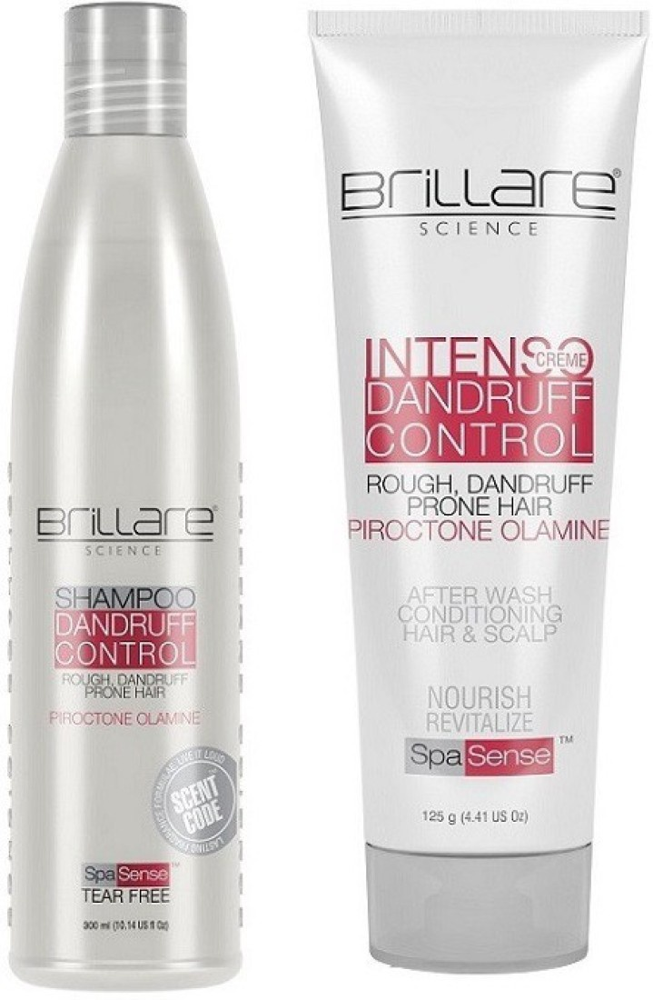

In [32]:
Image(img_sample.iloc[25]['image'], width=150)

In [33]:
img_sample.iloc[25]

uniq_id                                     0abfcbe0e17dd50c4cf5fb1d6037d514
crawl_timestamp                                    2016-06-02 08:05:27 +0000
product_url                http://www.flipkart.com/brillare-science-dandr...
product_name               Brillare Science Dandruff Control Shampoo & In...
pid                                                         CBKEJ5PZWGGSBBSC
retail_price                                                           450.0
discounted_price                                                       450.0
image                      /content/drive/MyDrive/images-classification/F...
is_FK_Advantage_product                                                False
description                Specifications of Brillare Science Dandruff Co...
product_rating                                           No rating available
overall_rating                                           No rating available
brand                                                       Brillare Science

L'opérateur de convolution

In [34]:
img_sample['image'].iloc[25]

'/content/drive/MyDrive/images-classification/Flipkart/Images/0abfcbe0e17dd50c4cf5fb1d6037d514.jpg'

In [35]:
from PIL import Image as Image_PIL

img_conv = Image_PIL.open('/content/drive/MyDrive/images-classification/Flipkart/Images/964648862f322b2cc153239af04b22ef.jpg')

In [36]:
img_conv = np.array(img_conv)

In [37]:
img_conv = cv2.resize(img_conv, (200,200))

In [38]:
def filtre_moyenneur(img, voisinage = 1):
    '''Remplace chaque pixel par l\'intensité moyenne de son voisinage'''
    etendue = 1+2*voisinage
    img2 = np.copy(img)

    for i in range(0, img.shape[0]):
        for j in range(0, img.shape[1]):
            if (i<voisinage)|(i>img.shape[0] - voisinage-1):
                img2[i,j] = int(255/2)
            if (j<voisinage)|(j>img.shape[0] - voisinage-1):
                img2[i,j] = int(255/2)


    for i in range(voisinage,img.shape[0]-voisinage):
        for j in range(voisinage,img.shape[1]-voisinage):
            mean = 0
            for mean_x in range(i-voisinage, i+voisinage+1):
                for mean_y in range(j-voisinage, j+voisinage+1):
                    mean += img[mean_x, mean_y]
            img2[i,j] = mean/(etendue**2)


    return img2

In [39]:
img_conv_traitee_1 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=1)
img_conv_traitee_2 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=2)
img_conv_traitee_3 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=3)
img_conv_traitee_4 = filtre_moyenneur(cv2.cvtColor(np.array(img_conv),cv2.COLOR_BGR2GRAY), voisinage=4)

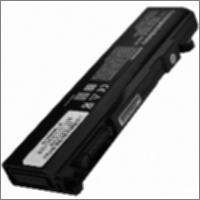

In [40]:
Image_PIL.fromarray(img_conv_traitee_1)

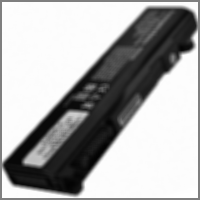

In [41]:
Image_PIL.fromarray(img_conv_traitee_2)

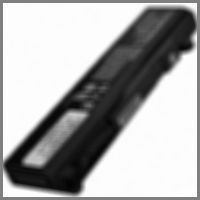

In [42]:
Image_PIL.fromarray(img_conv_traitee_3)

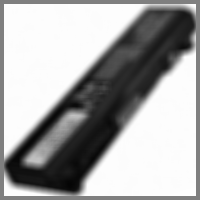

In [43]:
Image_PIL.fromarray(img_conv_traitee_4)

Prétraitement

Réduction de bruit

In [44]:
from scipy.ndimage import gaussian_filter
from PIL import Image as Image_PIL

In [45]:
im = np.array(Image_PIL.open(img_sample.iloc[25]['image']))

In [46]:
im = gaussian_filter(im, sigma=3)

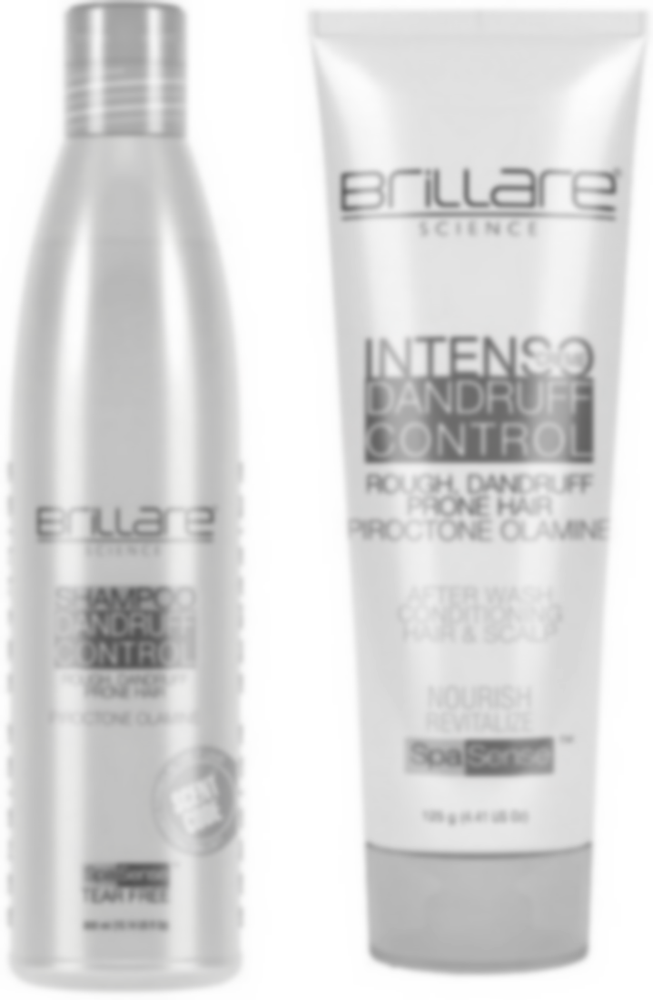

In [47]:
Image_PIL.fromarray(im)

Egalisation

In [48]:
hist, bins = np.histogram(im.flatten(), 256, [0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()

<Figure size 600x400 with 0 Axes>

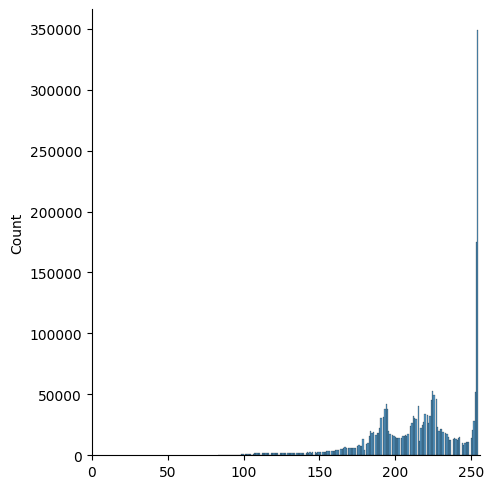

In [49]:
import seaborn as sns

plt.figure(figsize=(6,4))
sns.displot(im.flatten())
plt.xlim([0,256])
plt.show()

In [50]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')

In [51]:
im2=cdf[im]

<Figure size 600x400 with 0 Axes>

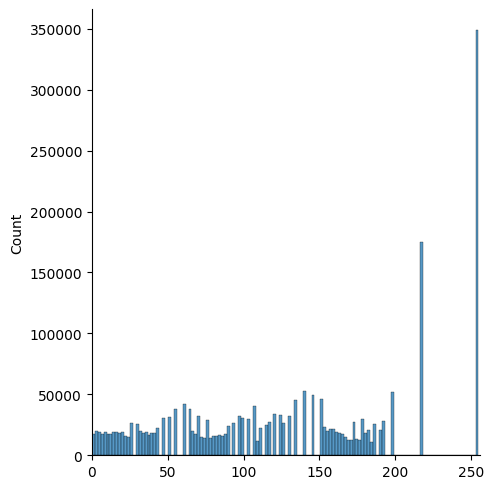

In [52]:
plt.figure(figsize=(6,4))
sns.displot(im2.flatten())
plt.xlim([0,256])
plt.show()

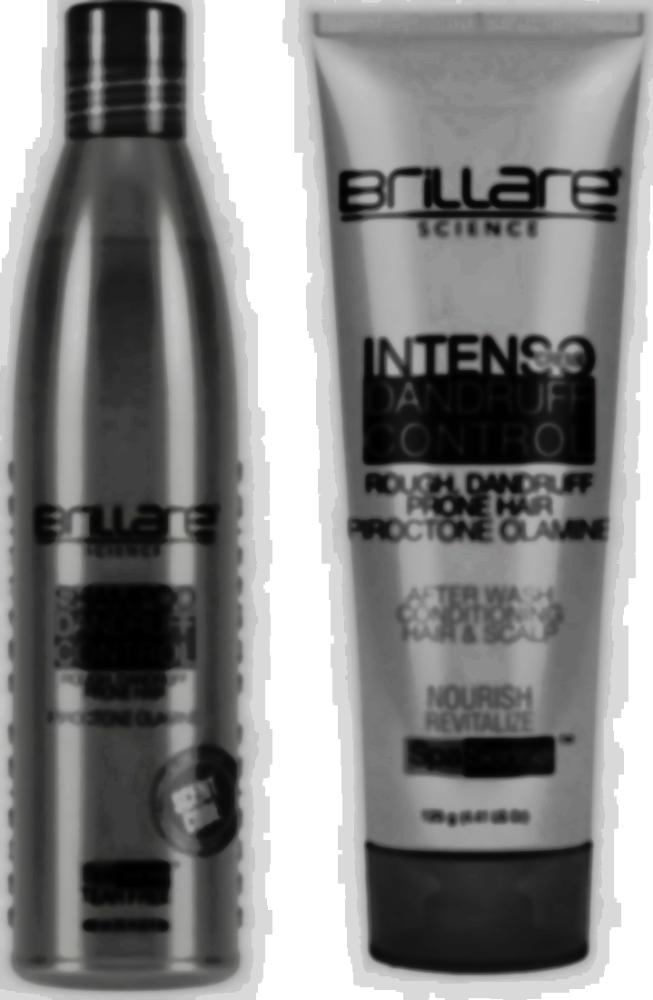

In [53]:
Image_PIL.fromarray(im2)

In [54]:
img3 = cv2.imread(img_sample.iloc[25]['image'],0)
equ = cv2.equalizeHist(img3)
res = np.hstack((img3,equ)) #stacking images side-by-side
cv2.imwrite('res.png',res)

True

In [55]:
img3.shape

(1100, 719)

Redimensionnement

In [56]:
# size of the images
from PIL import Image as Image_PIL

min_x = 100000
max_x = 0
min_y = 100000
max_y = 0
for image in img_sample['image'].tolist():
    shape = np.array(Image_PIL.open(image)).shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [57]:
print('min_x {},\nmax_x {},\nmin_y {},\nmax_y {}'.format(min_x, max_x, min_y, max_y))

min_x 160,
max_x 11042,
min_y 145,
max_y 8484


Redimensionnement

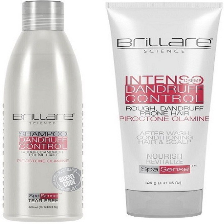

In [58]:
resize_img = cv2.resize(np.array(Image_PIL.open(img_sample.iloc[25]['image'])), dsize=(224,224))
Image_PIL.fromarray(resize_img)

In [59]:
# preteatment function

def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))
    del shape
    return im

In [60]:
from scipy.ndimage import gaussian_filter

def preprocess(image, path=False):
    '''prétraitement des images:
    * filtre gaussian
    * égalisation de l'histogramme
    * redimensionnement
    prend un entrée le chemin vers l'image et en sortie la matrice np.array de l'image traitée
    '''
    #ouverture du fichier
    if path == False: #si on a fourni un array en entree :
        im = image
    else: #si on a fourni un chemin vers le fichier en entree:
        im = np.array(Image_PIL.open(image))

#pretraiteemnt d'image
    #greyscale
    im = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)

    #flou gaussien
    im = gaussian_filter(im, sigma=2)

    #égalisation
    im = cv2.equalizeHist(im)

    return redim(im, 224, 224)

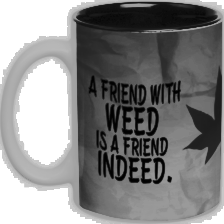

In [61]:
Image_PIL.fromarray(preprocess(img_sample.iloc[12]['image'], path=True))

## Détermination et affichage des descripteurs SIFT

In [62]:
i = np.random.randint(img_sample.shape[0]-1)
img_sift = preprocess(img_sample.iloc[25]['image'], path=True)

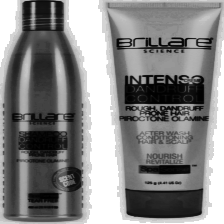

In [63]:
Image_PIL.fromarray(img_sift)

In [64]:
!pip install imutils

In [65]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
import imutils
cv2.ocl.setUseOpenCL(False)

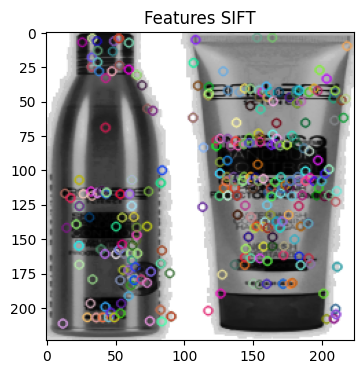

In [66]:
sift = cv2.SIFT_create()
kp = sift.detect(img_sift,None)
img=cv2.drawKeypoints(img_sift,kp,img_sift)

plt.figure(figsize=(4,4))
plt.title('Features SIFT')
plt.imshow(img)

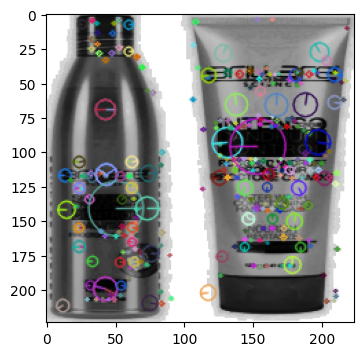

In [67]:
img=cv2.drawKeypoints(img_sift,kp,img_sift,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(4,4))
plt.imshow(img)

In [68]:
def get_files(path_list):
    '''Renvoie la liste des matrices d\'images à partir d'une liste de chemins'''
    liste_image = []
    compteur = 0
    for image_path in path_list:
        #im = cv2imread(image_path, 0)
        im = np.array(Image_PIL.open(image_path))
        liste_image.append(im)
        compteur +=1
    return liste_image

In [69]:
def create_features():
    '''Initialise un algorithme SIFT'''
    return cv2.SIFT_create()


def features(sift, image):
    '''renvoie les keypoints et descripteurs d\'une image à partir du détecteur sift'''
    keypoints,descriptors = sift.detectAndCompute(image,None)
    return [keypoints, descriptors]

def pipeline_feature(image):
    '''traitement complet d\'une image :
    * initialise l\'algorithme,
    *prétraite l'image,
    *recherche les features
    *retourne les features'''

    sift = create_features()
    image = preprocess(image, path=False)
    #gr = grey(image)
    keypoints, descriptors = features(sift, image)
    return keypoints, descriptors

In [70]:
# !pip install ipywidgets

In [71]:
from ipywidgets import IntProgress
from ipywidgets import Text
from IPython.display import display

j=0

sample = get_files(img_sample['image'].tolist())
max_count = len(sample)
f = IntProgress(min=0, max=max_count) # instantiate the bar
chaine = str(0)+'/'+str(max_count)
g = Text(value=chaine)
display(f) # display the bar
display(g)
liste_keypoints = []
liste_descripteurs = []


for array_image in sample:
    j+=1
    kea,des = pipeline_feature(array_image)
    liste_keypoints.append(kea)
    liste_descripteurs.append(des)
    f.value = j # signal to increment the progress bar
    g.value =str(j)+'/'+str(max_count)

IntProgress(value=0, max=1050)

Text(value='0/1050')

In [72]:
liste_descripteurs[0]

array([[ 63.,  24.,   2., ...,   0.,  59.,  82.],
       [  0.,  55.,  24., ...,  19.,   1.,   0.],
       [  0.,   1.,   0., ...,   3.,   0.,   0.],
       ...,
       [  0.,   0.,   0., ...,   0.,   0.,   0.],
       [  3.,   1.,  11., ...,   0.,   5.,  12.],
       [  0.,   0., 142., ...,   0.,   0.,   1.]], dtype=float32)

In [73]:
liste_descripteurs[0].reshape(1,-1)

array([[63., 24.,  2., ...,  0.,  0.,  1.]], dtype=float32)

In [74]:
print('Nombre de liste de keypoints : ', len(liste_keypoints))
print('Nombre de keypoints pour l\'élément 0 : ', len(liste_keypoints[0]))
print('Nombre de keypoints pour l\'élément 2 : ', len(liste_keypoints[2]))

Nombre de liste de keypoints :  1050
Nombre de keypoints pour l'élément 0 :  67
Nombre de keypoints pour l'élément 2 :  39


In [75]:
print('Dimension descripteurs élément 0 : ', liste_descripteurs[0].shape)
print('Dimension descripteurs élément 1 : ', liste_descripteurs[1].shape)

Dimension descripteurs élément 0 :  (67, 128)
Dimension descripteurs élément 1 :  (88, 128)


In [76]:
for el, ech in zip(liste_descripteurs, sample):
    print(el.shape, ' - ', ech.shape)

(67, 128)  -  (357, 400, 3)
(88, 128)  -  (1380, 776, 3)
(39, 128)  -  (1475, 1966, 3)
(112, 128)  -  (497, 273, 3)
(425, 128)  -  (2049, 1257, 3)
(193, 128)  -  (1000, 946, 3)
(471, 128)  -  (1100, 879, 3)
(366, 128)  -  (510, 1100, 3)
(621, 128)  -  (1417, 1209, 3)
(496, 128)  -  (1100, 979, 3)
(356, 128)  -  (955, 452, 3)
(396, 128)  -  (1045, 1100, 3)
(311, 128)  -  (1006, 1100, 3)
(237, 128)  -  (1100, 370, 3)
(211, 128)  -  (1100, 962, 3)
(133, 128)  -  (2033, 1994, 3)
(263, 128)  -  (1224, 1488, 3)
(236, 128)  -  (509, 1100, 3)
(313, 128)  -  (3000, 4140, 3)
(674, 128)  -  (1245, 1100, 3)
(130, 128)  -  (1488, 2800, 3)
(247, 128)  -  (1100, 1080, 3)
(239, 128)  -  (771, 1040, 3)
(189, 128)  -  (994, 1100, 3)
(185, 128)  -  (1000, 569, 3)
(340, 128)  -  (1100, 719, 3)
(1069, 128)  -  (1242, 992, 3)
(136, 128)  -  (539, 1201, 3)
(432, 128)  -  (1100, 646, 3)
(584, 128)  -  (1006, 1100, 3)
(114, 128)  -  (844, 1100, 3)
(149, 128)  -  (374, 1280, 3)
(298, 128)  -  (995, 850, 3)
(344

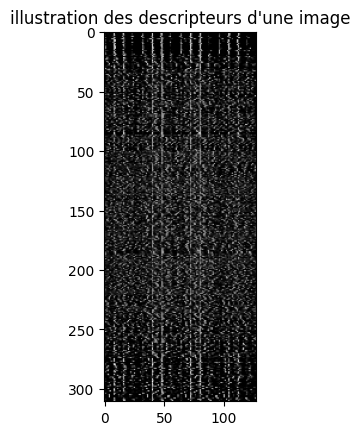

In [77]:
plt.title('illustration des descripteurs d\'une image')
plt.imshow(liste_descripteurs[12], cmap='gray')

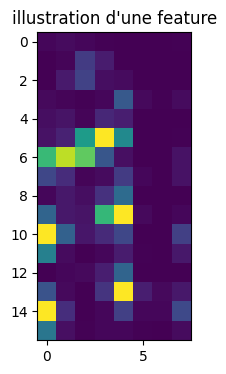

In [78]:
plt.figure(figsize=(4,4))
plt.title('illustration d\'une feature')
plt.imshow(liste_descripteurs[0][12].reshape(16,8))

In [79]:
def extraction_features(data_visu):
    '''Extraction des features à partir des données'''

    #chargement des images
    data_visu['image'] = data_visu['image'].apply(lambda x: "/content/drive/MyDrive/images-classification/Flipkart/Images/"+str(x))
    liste_images = get_files(data_visu['image'].tolist())
    max_count = len(liste_images)

    #affichage du compteur
    f = IntProgress(min=0, max=max_count) # instantiate the bar
    chaine = str(0)+'/'+str(max_count)
    g = Text(value=chaine)
    display(f) # display the bar
    display(g)
    liste_features = []
    liste_descripteurs = []
    liste_descripteurs_formates = []

    #boucle d'extraction des features de chaque image
    j=0
    for array_image in liste_images:
        j+=1
        fea, des = pipeline_feature(array_image)


        liste_features.append(fea)
        liste_descripteurs.append(des)
        f.value = j # signal to increment the progress bar
        g.value = str(j)+'/'+str(max_count)

    #harmonisation du nombre de features par image : détermination dimension maximum
    nb_features_max = 0
    for descripteur in liste_descripteurs:
        if descripteur.shape[0] > nb_features_max:
            nb_features_max = descripteur.shape[0]
    #on transforme les array des descripteurs en vecteurs (PM : un descripteur = 224 pixels de large)
    liste_descripteurs_flatten = []
    for descripteur in liste_descripteurs:
        liste_descripteurs_flatten.append(descripteur.reshape(1,-1))

    #harmonisation du nombre de features par image : ajout pixels noirs
    k = 0
    for descripteur in liste_descripteurs_flatten:
        if descripteur.shape[1] <= nb_features_max*224:
            liste_descripteurs_formates.append(
                np.hstack([descripteur.reshape(1,-1),
                           np.zeros(nb_features_max*224 - descripteur.shape[1]).reshape(1,-1)])
            )
        else:
            liste_descripteurs_formates.append(descripteur)

    #assemblage_features
    array_descripteurs = np.vstack(liste_descripteurs_formates)

    del liste_descripteurs_formates, descripteur, liste_images, max_count


    return liste_features, liste_descripteurs, array_descripteurs

In [80]:
data_visuelle = pd.concat([train, test]).copy()
# data_visuelle = data.sample(100, random_state=42)

features_total, descripteurs_total, descripteurs_array = extraction_features(data_visuelle)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


IntProgress(value=0, max=1050)

Text(value='0/1050')

In [81]:
descripteurs_array.shape

(1050, 425152)

In [82]:
descripteurs_array[0,:]

array([0., 0., 0., ..., 0., 0., 0.])

(1050, 425152)


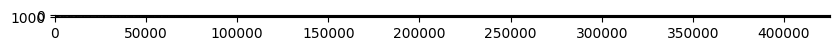

In [83]:
print(descripteurs_array.shape)
plt.figure(figsize=(10,10))
plt.imshow(descripteurs_array, cmap='gray')

**Création de nouvelles features à partir des descripteurs**

In [84]:
descripteurs_total[0].shape

(111, 128)

In [85]:
np.var(descripteurs_total[0])

1590.6552

In [86]:
from scipy.stats import moment

liste_min = [np.min(descripteur) for descripteur in descripteurs_total]
liste_max = [np.max(descripteur) for descripteur in descripteurs_total]
liste_mean = [np.mean(descripteur) for descripteur in descripteurs_total]
liste_var = [np.var(descripteur) for descripteur in descripteurs_total]
liste_order_3 = [np.mean(moment(descripteur, moment = 3, axis=1)) for descripteur in descripteurs_total]
liste_order_4 = [np.mean(moment(descripteur, moment = 4, axis=1)) for descripteur in descripteurs_total]

In [87]:
array_features_descripteurs = np.vstack([liste_min, liste_max, liste_mean, liste_var, liste_order_3, liste_order_4])

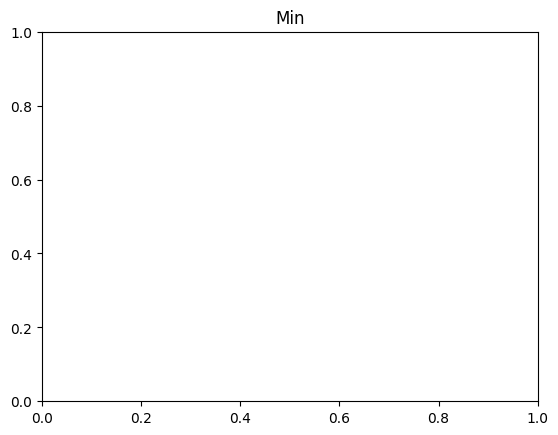

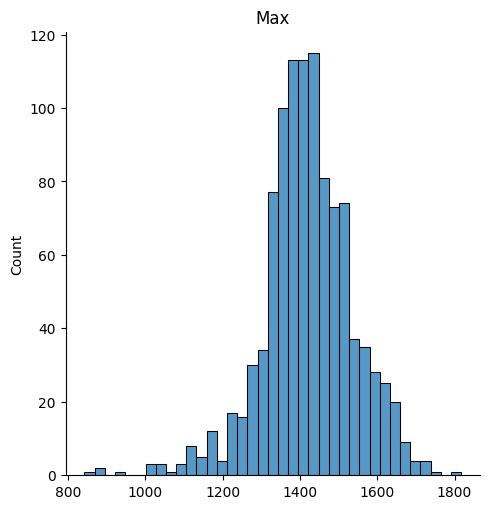

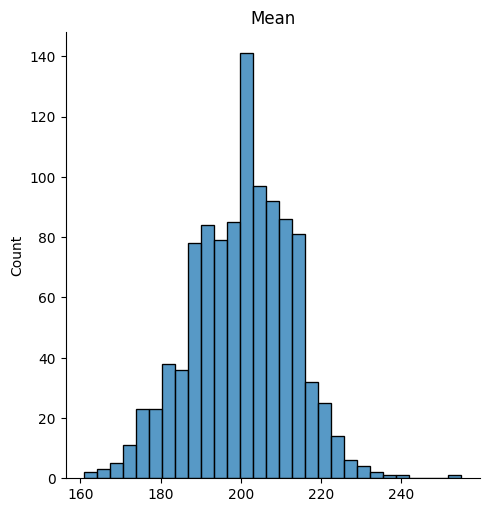

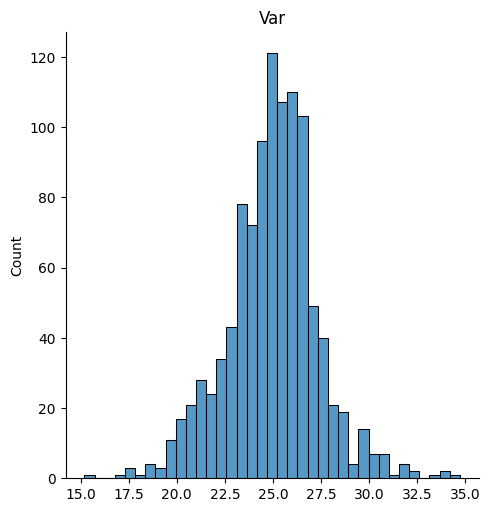

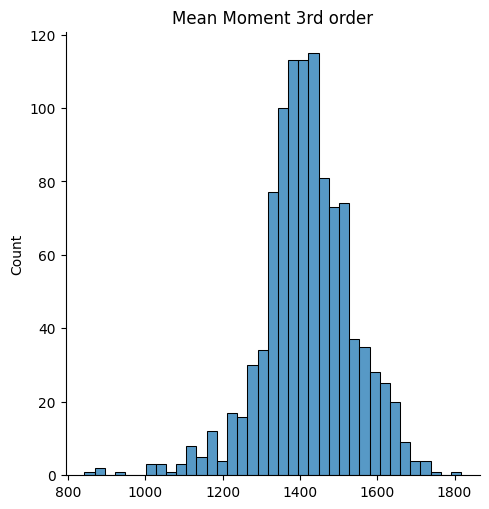

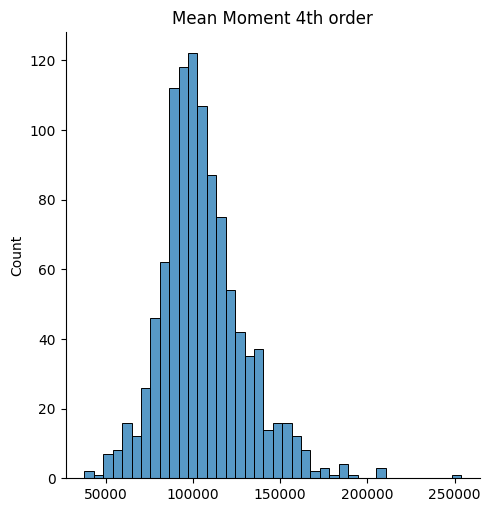

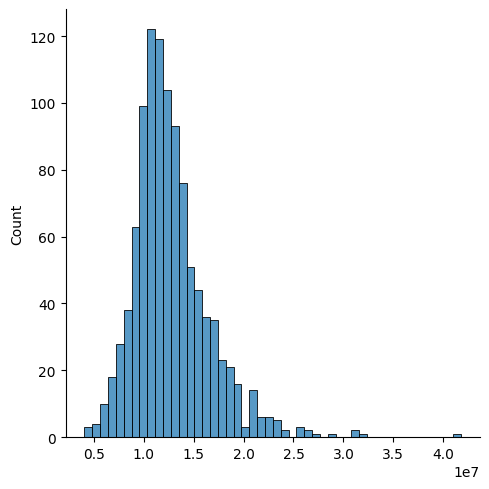

In [88]:
%matplotlib inline
import seaborn as sns

plt.figure()
plt.title('Min')
sns.displot(liste_var)


plt.title('Max')
sns.displot(liste_max)


plt.title('Mean')
sns.displot(liste_mean)


plt.title('Var')
sns.displot(liste_var)


plt.title('Mean Moment 3rd order')
sns.displot(liste_order_3)

plt.title('Mean Moment 4th order')
sns.displot(liste_order_4)

Export

In [89]:
np.save('array_descripteurs.csv', descripteurs_array)
np.save('array_features_descripteurs', array_features_descripteurs)

## Classifieur non supervisé

Réductions de dimension

PCA

In [90]:
from sklearn.preprocessing import StandardScaler

pca_descripteurs = PCA()
features_ss = StandardScaler()
pca_descripteurs.fit(features_ss.fit_transform(np.transpose(descripteurs_array.T)))

PCA()

In [91]:
pca_descripteurs.n_components_

1050

In [92]:
np.cumsum(pca_descripteurs.explained_variance_ratio_)

array([0.24461337, 0.36122442, 0.44249093, ..., 1.        , 1.        ,
       1.        ])

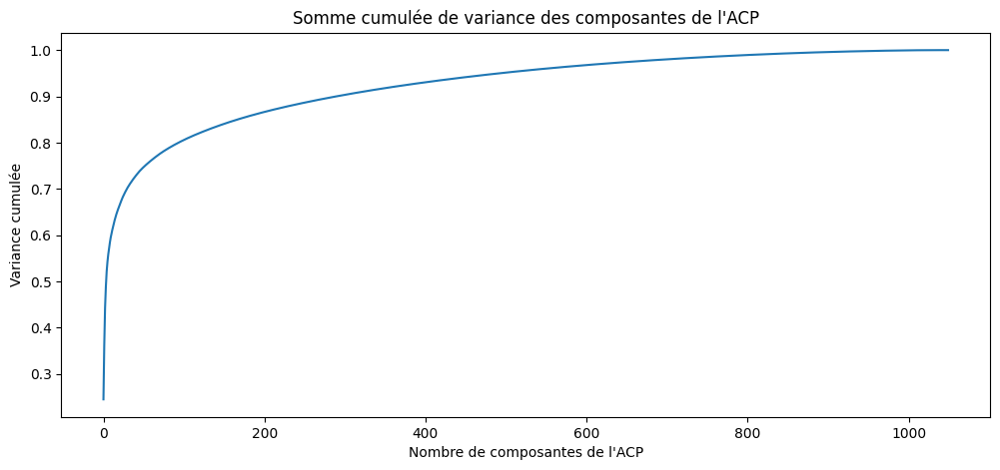

In [93]:
plt.figure(figsize=(12,5))
plt.title('Somme cumulée de variance des composantes de l\'ACP')
plt.xlabel('Nombre de composantes de l\'ACP')
plt.ylabel('Variance cumulée')
plt.plot(list(range(descripteurs_array.shape[0])),
         np.cumsum(pca_descripteurs.explained_variance_ratio_))

96% de la variance totale avec 800 features

In [94]:
array_descripteurs_reduit = pca_descripteurs.transform(descripteurs_array)

In [95]:
array_descripteurs_reduit

array([[ 1.21025281e+01, -2.92953506e+01, -2.32743742e+01, ...,
         9.92910571e-02,  1.02419382e+01, -1.46935281e+01],
       [ 2.10202199e+02, -6.21407009e+02, -6.04710393e+02, ...,
        -8.62149743e+00,  6.75306692e+00, -5.89571289e+00],
       [ 8.85670507e-01, -1.04220191e+00, -1.10017095e-01, ...,
        -1.05326421e+00,  2.83294169e+01, -6.94175581e+00],
       ...,
       [ 1.70321649e+03, -4.24115766e+03, -3.75363047e+03, ...,
        -7.02285903e-01,  4.87858965e+01, -6.60396269e+00],
       [ 4.62649543e+01, -1.17394089e+02, -1.05454035e+02, ...,
         2.55807792e+00,  2.72364665e+01, -3.98534791e-01],
       [ 3.05196655e+02, -8.59046485e+02, -8.35251660e+02, ...,
        -1.78409552e+00,  2.98466573e+01, -1.53375208e+01]])

In [96]:
np.save('data_saved_array_descripteurs_reduit.csv', array_descripteurs_reduit)

**Classification**

In [97]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

**Kmeans**

In [98]:
# prendre le nombre des categories que ont veut traiter et multiplier par 10
dict_kmeans = {}
inertia = {}
max_clusters=70

f = IntProgress(min=0, max=max_clusters) # instantiate the bar
chaine = str(0)+'/'+str(max_count)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters+1):
    kmeans = KMeans(n_clusters=k,
                   verbose=0,
                   random_state=0,
                   ).fit(array_descripteurs_reduit)
    inertia[k] = kmeans.inertia_
    dict_kmeans[k] = kmeans
    f.value = k # signal to increment the progress bar
    g.value =str(k+1)+'/'+str(max_clusters)

IntProgress(value=0, max=70)

Text(value='0/1050')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

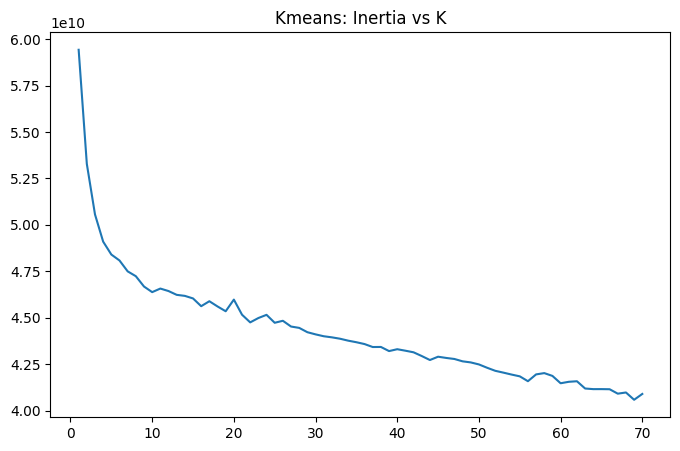

In [99]:
import seaborn as sns
import pandas as pd

plt.figure(figsize=(8,5))
plt.title('Kmeans: Inertia vs K')
sns.lineplot(x=list(inertia.keys()),
             y=list(inertia.values()));

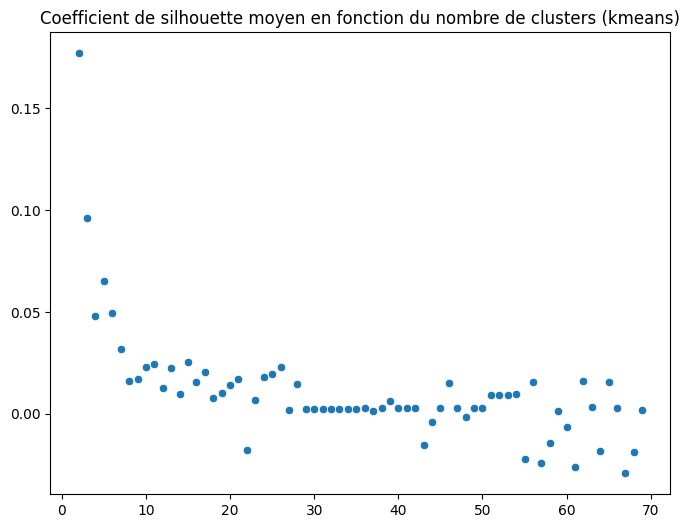

In [100]:
from sklearn.metrics import silhouette_score
silhouettes_kmeans = {}
for i in range(2,max_clusters):
    silhouettes_kmeans[i] = silhouette_score(X = array_descripteurs_reduit,
                                             labels= list(dict_kmeans[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans.keys()),
               y = list(silhouettes_kmeans.values()))
plt.show()

In [101]:
for key, value in silhouettes_kmeans.items():
    if value == max(silhouettes_kmeans.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters = key

le coefficient de silhouette est maximal pour 2 clusters (score = 0.17693471207555148)


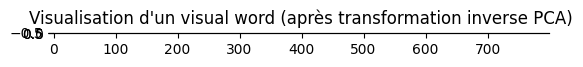

In [102]:
plt.title('Visualisation d\'un visual word (après transformation inverse PCA)')

plt.imshow(np.dot(dict_kmeans[25].cluster_centers_[7], pca_descripteurs.components_[:, :800]).reshape(1,-1))

In [103]:
from sklearn import manifold, decomposition

tsne = manifold.TSNE(n_components=2, perplexity=30,
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(array_descripteurs_reduit)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["cat_lvl_1"]
print(df_tsne.shape)

(1050, 3)


## Analyse visuelle : affichage T-SNE selon catégories d'images

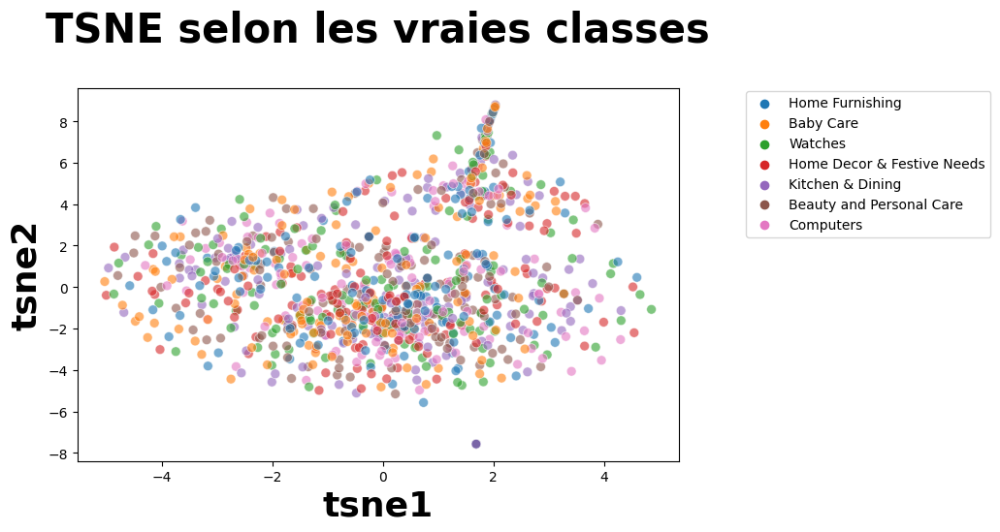

In [104]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(bbox_to_anchor=(1.1,  1.01))

plt.show()

## Analyse mesures : similarité entre catégories et clusters

###  Création de clusters à partir du T-SNE

In [105]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

(1050, 4)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


###  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters

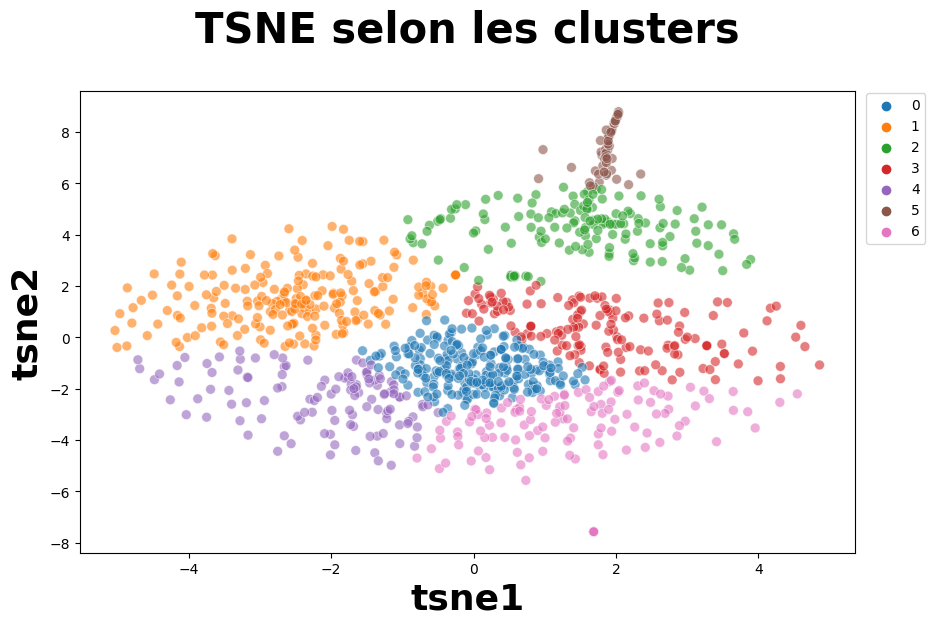

ARI :  0.00215082281723201


In [106]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(bbox_to_anchor=(1.1,  1.01))

plt.show()

labels = data_labels["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

### Analyse par classes

In [107]:
df_tsne.groupby("cluster").count()["class"]

cluster
0    232
1    204
2    148
3    156
4    120
5     66
6    124
Name: class, dtype: int64

In [108]:
labels.value_counts()

4    150
0    150
6    150
3    150
5    150
1    150
2    150
Name: label, dtype: int64

In [109]:
conf_mat = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat)

[[27 31 25 14 31  9 13]
 [27 30 13 33 18 11 18]
 [35 32 24 22  9  5 23]
 [40 25 29 19 15  6 16]
 [40 29 22 19 11 11 18]
 [32 28 21 26 15 11 17]
 [31 29 14 23 21 13 19]]


In [110]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)

    # corresp = np.argmax(conf_mat, axis=0)
    corresp = [6, 1, 5, 3, 4, 0, 2]
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x])

    return labels['y_pred_transform']

cls_labels_transform = conf_mat_transform(labels, cls.labels_)
conf_mat = metrics.confusion_matrix(labels, cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(labels, cls_labels_transform))

Correspondance des clusters :  [6, 1, 5, 3, 4, 0, 2]
[[ 9 31 13 14 31 25 27]
 [11 30 18 33 18 13 27]
 [ 5 32 23 22  9 24 35]
 [ 6 25 16 19 15 29 40]
 [11 29 18 19 11 22 40]
 [11 28 17 26 15 21 32]
 [13 29 19 23 21 14 31]]

              precision    recall  f1-score   support

           0       0.14      0.06      0.08       150
           1       0.15      0.20      0.17       150
           2       0.19      0.15      0.17       150
           3       0.12      0.13      0.12       150
           4       0.09      0.07      0.08       150
           5       0.14      0.14      0.14       150
           6       0.13      0.21      0.16       150

    accuracy                           0.14      1050
   macro avg       0.14      0.14      0.13      1050
weighted avg       0.14      0.14      0.13      1050



<Axes: >

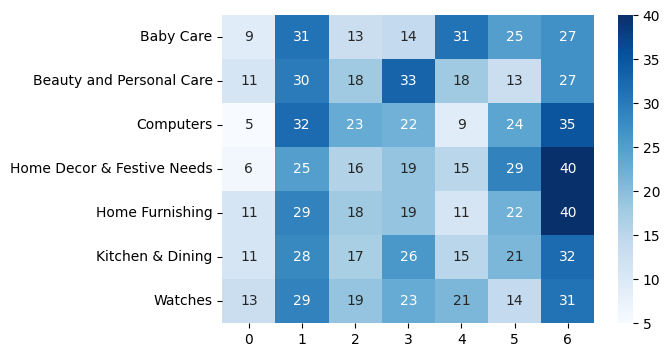

In [111]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True, cmap="Blues")

## CNN Données visuelles

In [112]:
def get_files(path_list):
    '''Renvoie la liste des matrices d\'images à partir d'une liste de chemins'''
    liste_image = []
    compteur = 0
    for image_path in path_list:
        #im = cv2.imread(image_path, 0)
        im = np.array(Image_PIL.open(image_path))
        liste_image.append(im)
        compteur +=1

    del compteur
    del im

    return liste_image

In [113]:
def redim(array_im, width, height):
    '''Redimensionne l\'image correspondant à array_im dans la largeur et la hauteur définie'''
    min_x = 100000
    max_x = 0
    min_y = 100000
    max_y = 0
    shape = array_im.shape
    if shape[0] < min_x:
        min_x = shape[0]
    elif shape[0] > max_x:
        max_x = shape[0]
    if shape[1] < min_y:
        min_y = shape[1]
    elif shape[1] > max_y:
        max_y = shape[1]
    im = cv2.resize(array_im, dsize=(width,height))

    del shape

    return im

Données

In [114]:
train['image'] = train['image'].apply(lambda x: "/content/drive/MyDrive/images-classification/Flipkart/Images/"+str(x))
test['image'] = test['image'].apply(lambda x: "/content/drive/MyDrive/images-classification/Flipkart/Images/"+str(x))



In [115]:
train_cnn = get_files(train.copy()['image'].tolist())
test_cnn = get_files(test.copy()['image'].tolist())

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [116]:
len(train_cnn)

787

In [117]:
len(test_cnn)

263

In [118]:
redim(train_cnn[0], 224, 224).shape

(224, 224, 3)

In [119]:
redim(train_cnn[0], 224, 224).reshape(1,-1,3).shape

(1, 50176, 3)

In [120]:
train_array_cnn = np.vstack([redim(img, 224, 224).reshape(1,224,224,3) for img in train_cnn])
test_array_cnn = np.vstack([redim(img, 224, 224).reshape(1,224,224,3) for img in test_cnn])

In [121]:
train_array_cnn.shape

(787, 224, 224, 3)

In [122]:
from sklearn.preprocessing import OneHotEncoder

one_hot = OneHotEncoder(handle_unknown='ignore')
array_cats = one_hot.fit_transform(np.array(train['cat_lvl_1']).reshape(-1,1)) # turn labels into numbers

In [123]:
array_cats.todense().shape

(787, 7)

In [124]:
train_array_cats = one_hot.transform(train[['cat_lvl_1']]).todense()
test_array_cats = one_hot.transform(test[['cat_lvl_1']]).todense()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but OneHotEncoder was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but OneHotEncoder was fitted without feature names
  warnings.warn(


In [125]:
train_array_cats.shape

(787, 7)

In [126]:
test_array_cats.shape

(263, 7)

In [127]:
one_hot.categories_[0].shape[0]

7

## Construction Réseau VGG16

In [128]:
from keras.layers import Input, Lambda, Dense, Flatten
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

In [129]:
# re-size all the images to this
IMAGE_SIZE = [224, 224]

In [130]:
train_array_cats
test_array_cats

matrix([[0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 1., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [1., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 1.]])

In [131]:
train_array_cnn.shape

(787, 224, 224, 3)

In [132]:
test_array_cnn.shape

(263, 224, 224, 3)

In [133]:
# add preprocessing layer to the front of VGG
vgg = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

58889256/58889256 [==============================] - 0s 0us/step


In [134]:
# don't train existing weights
for layer in vgg.layers:
  layer.trainable = False

In [135]:
  # useful for getting number of classes
folders = glob('train_array_cats')

In [136]:
# our layers - you can add more if you want
x = Flatten()(vgg.output)
# x = Dense(1000, activation='relu')(x)
prediction = Dense(one_hot.categories_[0].shape[0], activation='softmax')(x)

In [137]:
# create a model object
model = Model(inputs=vgg.input, outputs=prediction)

In [138]:
# view the structure of the model
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

Entraînement

In [139]:
train_array_cnn.shape

(787, 224, 224, 3)

In [140]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [141]:
model_info = model.fit(train_array_cnn, train_array_cats, epochs=5, batch_size=5, verbose=2)

Epoch 1/5
158/158 - 30s - loss: 23.9662 - accuracy: 0.6785 - 30s/epoch - 187ms/step
Epoch 2/5
158/158 - 28s - loss: 5.3518 - accuracy: 0.9174 - 28s/epoch - 178ms/step
Epoch 3/5
158/158 - 28s - loss: 0.9226 - accuracy: 0.9784 - 28s/epoch - 179ms/step
Epoch 4/5
158/158 - 28s - loss: 0.5512 - accuracy: 0.9848 - 28s/epoch - 178ms/step
Epoch 5/5
158/158 - 28s - loss: 0.4201 - accuracy: 0.9898 - 28s/epoch - 177ms/step


In [142]:
for couche in model.get_weights():
    print(couche.shape)

(3, 3, 3, 64)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 128)
(128,)
(3, 3, 128, 128)
(128,)
(3, 3, 128, 256)
(256,)
(3, 3, 256, 256)
(256,)
(3, 3, 256, 256)
(256,)
(3, 3, 256, 512)
(512,)
(3, 3, 512, 512)
(512,)
(3, 3, 512, 512)
(512,)
(3, 3, 512, 512)
(512,)
(3, 3, 512, 512)
(512,)
(3, 3, 512, 512)
(512,)
(25088, 7)
(7,)


In [143]:
predictions_test = model.predict(test_array_cnn)

9/9 [==============================] - 9s 998ms/step


In [144]:
predictions_test = np.asarray(predictions_test)
test_array_cats = np.asarray(test_array_cats)

In [145]:
from sklearn.metrics import accuracy_score
accuracy_score(np.argmax(predictions_test, axis=1),
               np.argmax(test_array_cats, axis=1))

0.8288973384030418

In [146]:
# np.argmax(test_array_cats, axis=1).reshape(1,-1)

In [147]:
# np.argmax(predictions_test, axis=1)

Classification non supervisée

In [148]:
from keras.models import clone_model

In [149]:
# On retire les 2 dernières couches du réseau de neurone pour accéder aux features
unsupervised_model= clone_model(model)
unsupervised_model.layers.pop()
unsupervised_model.layers.pop()
unsupervised_model.compile(loss='mean_squared_error', optimizer='sgd', metrics=['accuracy'])

In [150]:
unsupervised_array = unsupervised_model.predict(train_array_cnn)

25/25 [==============================] - 27s 1s/step


In [151]:
unsupervised_array.shape

(787, 7)

In [152]:
dict_kmeans = {}
inertia = {}
max_clusters=20

f = IntProgress(min=0, max=max_clusters) # instantiate the bar
chaine = str(0)+'/'+str(max_clusters)
g = Text(value=chaine)
display(f) # display the bar
display(g)

for k in range(1,max_clusters+1):
    kmeans = KMeans(n_clusters=k,
                   verbose=0,
                   random_state=0, n_init=10 ,
                   ).fit(unsupervised_array)
    inertia[k] = kmeans.inertia_
    dict_kmeans[k] = kmeans
    f.value = k # signal to increment the progress bar
    g.value =str(k+1)+'/'+str(max_clusters)

IntProgress(value=0, max=20)

Text(value='0/20')

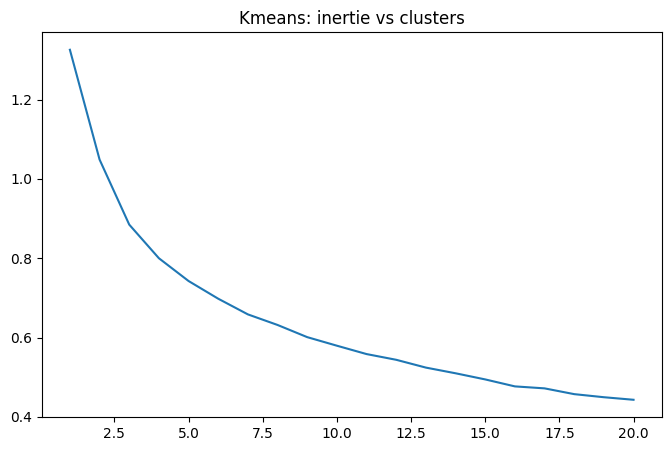

In [153]:
plt.figure(figsize=(8,5))
plt.title('Kmeans: inertie vs clusters')
sns.lineplot(x=inertia.keys(), y=inertia.values());

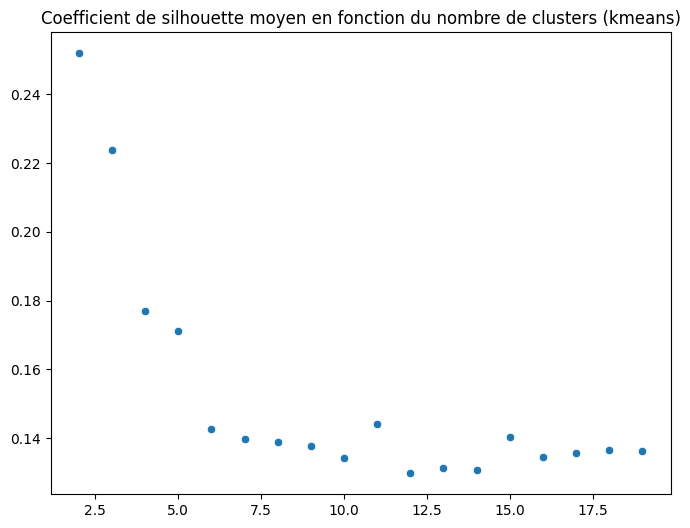

In [154]:
silhouettes_kmeans = {}
for i in range(2,max_clusters):
    silhouettes_kmeans[i] = silhouette_score(X = unsupervised_array,
                                             labels= list(dict_kmeans[i].labels_))

plt.figure(figsize=(8,6)),
plt.title('Coefficient de silhouette moyen en fonction du nombre de clusters (kmeans)')
sns.scatterplot(x = list(silhouettes_kmeans.keys()),
               y = list(silhouettes_kmeans.values()))
plt.show()

In [155]:
for key, value in silhouettes_kmeans.items():
    if value == max(silhouettes_kmeans.values()):
        print('le coefficient de silhouette est maximal pour {} clusters (score = {})'.format(key, value))
        nb_clusters_optimal = key

le coefficient de silhouette est maximal pour 2 clusters (score = 0.25199049711227417)


In [156]:
pd.DataFrame(dict_kmeans[7].labels_)[0].value_counts()

2    199
0    129
3    124
5    116
6    109
4     64
1     46
Name: 0, dtype: int64

In [157]:
train_labelized = train.copy()
train_labelized['label_kmeans'] = dict_kmeans[nb_clusters_optimal].labels_

In [158]:
train_labelized.groupby(['label_kmeans']).apply(lambda x: (x.groupby('cat_lvl_1')
                                      .count()
                                      .sort_values('cat_lvl_1', ascending=False))
                                     )['uniq_id']

label_kmeans  cat_lvl_1                 
0             Watches                       82
              Kitchen & Dining              77
              Home Furnishing               69
              Home Decor & Festive Needs    73
              Computers                     77
              Beauty and Personal Care      73
              Baby Care                     84
1             Watches                       30
              Kitchen & Dining              42
              Home Furnishing               36
              Home Decor & Festive Needs    39
              Computers                     27
              Beauty and Personal Care      50
              Baby Care                     28
Name: uniq_id, dtype: int64

In [159]:
pd.DataFrame(train, ).head(5)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
165,785b4383b12106dd172306d427d8f7b2,2015-12-01 12:40:44 +0000,http://www.flipkart.com/rockmantra-cute-two-ca...,Rockmantra Cute Two Cats Ceramic Mug,MUGEAGGKFBTYPN4Z,499.0,349.0,/content/drive/MyDrive/images-classification/F...,False,Rockmantra Cute Two Cats Ceramic Mug (5.5 l)\r...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Kitchen & Dining,Coffee Mugs,Rockmantra Coffee Mugs
248,45d0af2c709de47268c80c35a117de44,2015-12-01 12:40:44 +0000,http://www.flipkart.com/malhar-niko-male-doll-...,Malhar Niko Male Doll Showpiece - 25 cm,SHIEY382SR75SXEY,6395.0,5436.0,/content/drive/MyDrive/images-classification/F...,True,Buy Malhar Niko Male Doll Showpiece - 25 cm ...,No rating available,No rating available,Malhar,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Decor & Festive Needs,Showpieces,Malhar Showpieces
310,64b463dc0b75ae40a848498c657041e6,2015-12-01 06:13:00 +0000,http://www.flipkart.com/linksys-smart-wi-fi-ro...,Linksys Smart Wi-Fi Router,RTRDZTF9DBT4CW8U,14999.0,13500.0,/content/drive/MyDrive/images-classification/F...,True,Buy Linksys Smart Wi-Fi Router only for Rs. 0....,No rating available,No rating available,Linksys,"{""product_specification""=>[{""key""=>""Encryption...",Computers,Network Components,Routers
685,6b5cdfe68595fbcab0e05dc625d3d66a,2015-12-31 09:19:31 +0000,http://www.flipkart.com/richfeel-sunshield-spf...,Richfeel Sunshield - SPF 30 PA++,SNRE4F2GBWVF6UKR,299.0,224.0,/content/drive/MyDrive/images-classification/F...,False,Flipkart.com: Buy Richfeel Sunshield - SPF 30 ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"",...",Beauty and Personal Care,Body and Skin Care,Face Care
843,e86daf9ebcdfc5c5dd088cdb7f8f8db6,2015-12-29 05:07:38 +0000,http://www.flipkart.com/epresent-mfan-1-fan-us...,Epresent Mfan 1 Fan USB USB Fan,USGEB3HTYWCYT2HY,269.0,219.0,/content/drive/MyDrive/images-classification/F...,False,Buy Epresent Mfan 1 Fan USB USB Fan for Rs.219...,No rating available,No rating available,Epresent,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,USB Gadgets


In [160]:
train_labelized['label_kmeans']

165     1
248     0
310     1
685     0
843     0
       ..
330     1
466     0
121     0
1044    0
860     0
Name: label_kmeans, Length: 787, dtype: int32

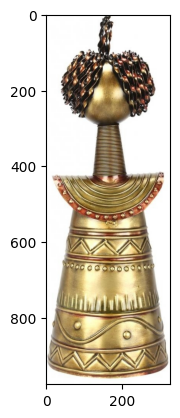

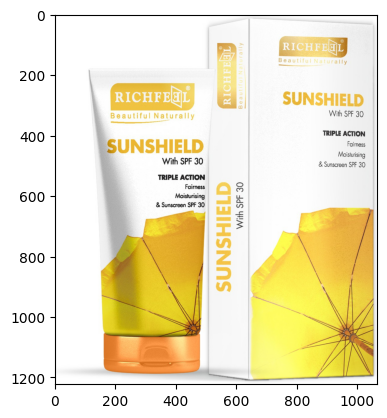

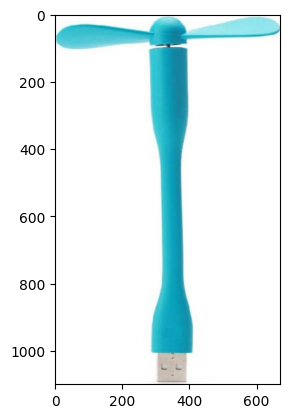

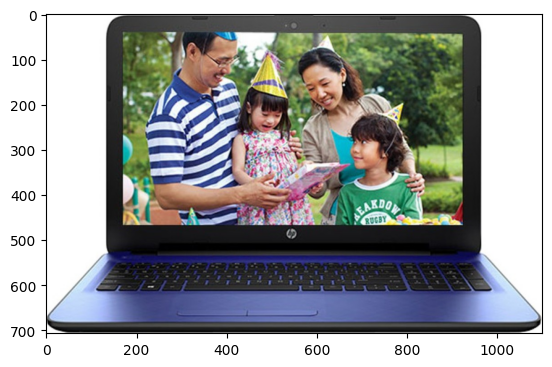

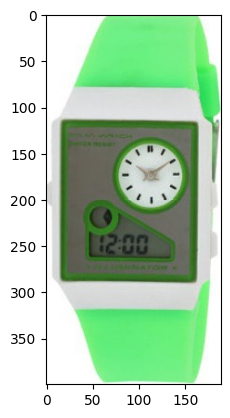

...

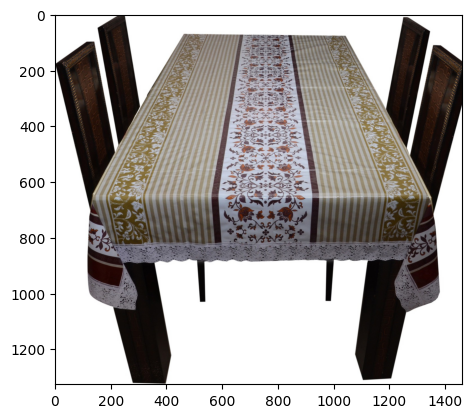

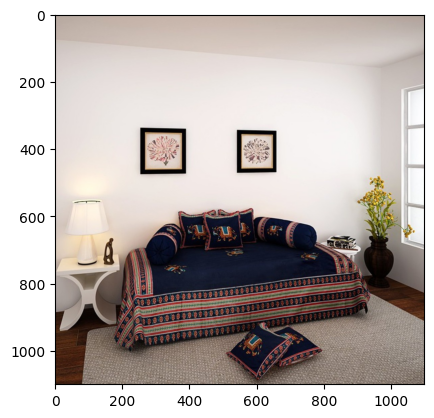

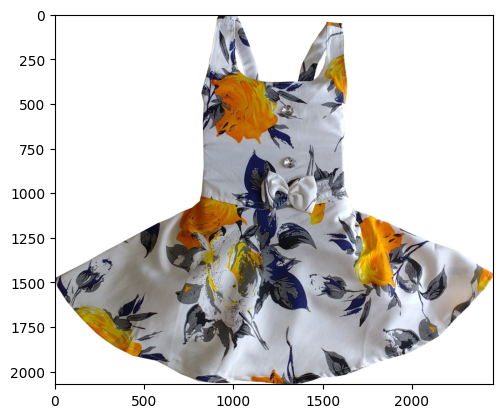

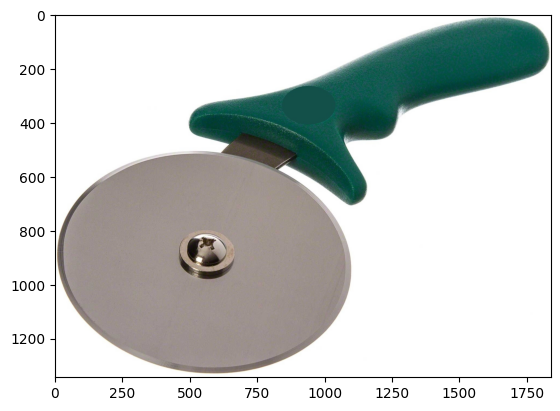

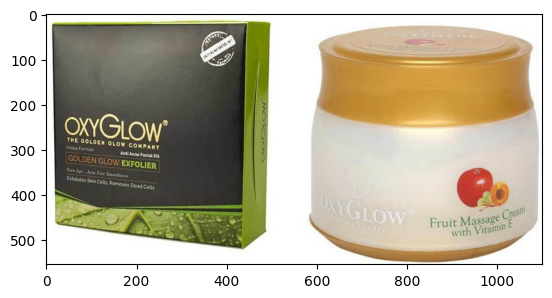

In [161]:
%matplotlib inline
k = 0
for image in train_labelized[train_labelized['label_kmeans'] == 0]['image'].tolist():
    if k < 20:
        chemin = image
        plt.figure()
        plt.imshow(Image_PIL.open(chemin))
        plt.show()
        k+=1
    else:
        break

In [162]:
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets


Classification supervisée

In [164]:
from tensorflow.keras.applications.vgg16 import preprocess_input
model_VGG16 = VGG16(weights="imagenet", include_top=False,input_tensor=Input(shape=(224, 224, 3)))

In [165]:
for layer in model_VGG16.layers:
  layer.trainable = False

In [166]:
model_VGG16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [167]:
# Creation nouveau modele
input_layer = model_VGG16.input
last_output = model_VGG16.layers[-2].output

New_model_vgg = Model(inputs=input_layer, outputs=last_output)

In [168]:
# complilation
New_model_vgg.compile(optimizer = 'adam',
                      loss = 'categorical_crossentropy',
                      metrics = ['accuracy'])

New_model_vgg.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [169]:
# Extraction features
from tensorflow.keras.preprocessing.image import load_img, img_to_array
images_features = []
i=0
for leaf in img_sample['image']:
  img = load_img(leaf ,target_size=(224,224))
  img_data = img_to_array(img)
  img_data = np.expand_dims(img_data, axis=0)
  img_data = preprocess_input(img_data)
  images_features.append(model.predict(img_data, verbose=0)[0]) # predict from pretrained model

images_features = np.asarray(images_features)
images_features.shape

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


(1050, 7)

## Réduction dimension et analyse

### Réduction de dimension PCA

In [170]:
from sklearn import manifold, decomposition
print(images_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(images_features)
print(feat_pca.shape)

(1050, 7)
(1050, 6)


### Réduction de dimension T-SNE et affichage des images selon vraies classes

In [171]:
from sklearn import manifold, decomposition
import time

temps1 = time.time()

tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

duration1=time.time()-temps1
print("temps de T-SNE : ", "%15.2f" % duration1, "secondes")

temps de T-SNE :            10.37 secondes


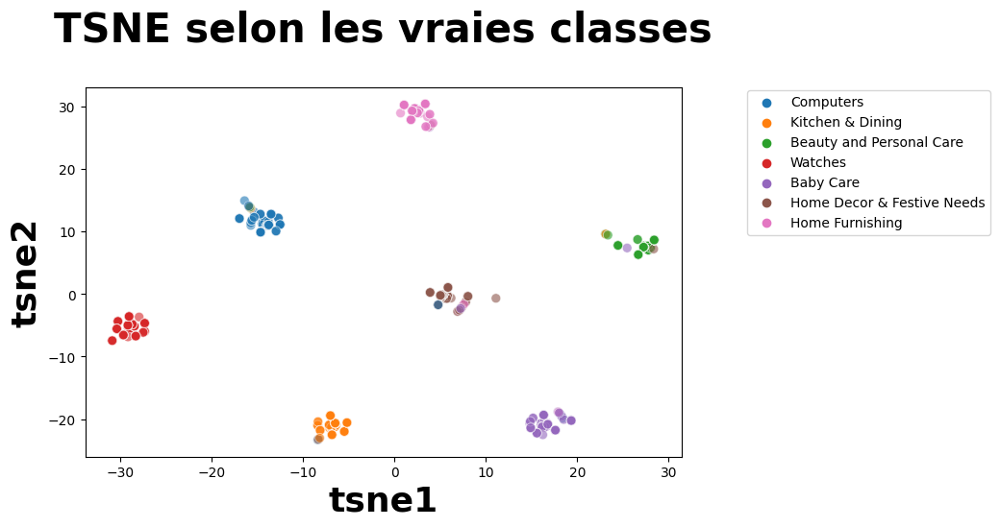

In [172]:
df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
df_tsne["class"] = img_sample["cat_lvl_1"].reset_index(drop=True)

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="class",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(bbox_to_anchor=(1.1,  1.01))

plt.show()

Bonne separation des categories

In [173]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, n_init=100)
cls.fit(X_tsne)

KMeans(n_clusters=7, n_init=100)

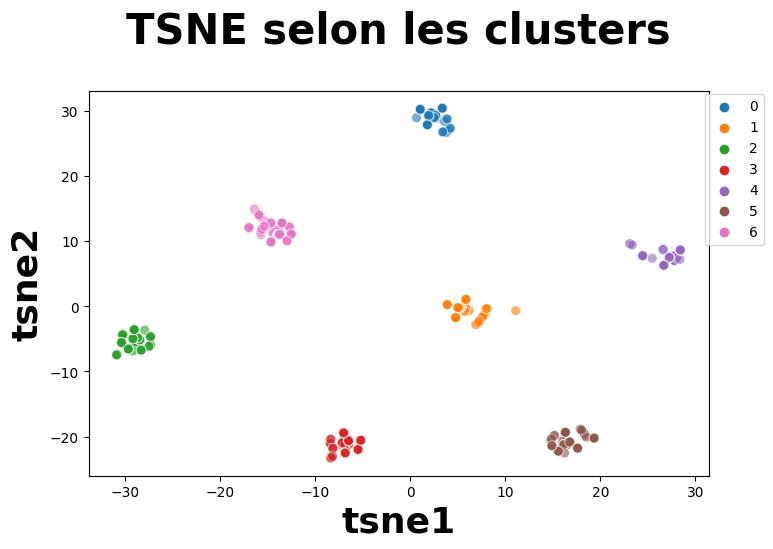

ARI :  0.8924217910474204


In [174]:
#calcule a partir des composantes du TSNE "tsne1"et y="tsne2"
df_tsne["cluster"] = cls.labels_

plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(bbox_to_anchor=(1.1, 1.01))

plt.show()

labels = img_sample["cat_lvl_1"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

In [175]:
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

ARI :  0.8924217910474204


In [176]:
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder

le = preprocessing.LabelEncoder()
le.fit(img_sample["cat_lvl_1"])
img_sample["label"] = le.transform(img_sample["cat_lvl_1"])

labels = img_sample["label"]


In [177]:
conf_mat = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat)

[[  6   5   0   1   2 135   1]
 [  0   2   0   0 147   0   1]
 [  0   2   0   2   1   2 143]
 [  1 143   1   1   2   2   0]
 [140   7   0   0   0   3   0]
 [  0   1   0 143   3   0   3]
 [  0   0 149   0   0   0   1]]


In [178]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)

    corresp = np.argmax(conf_mat, axis=0)
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x])

    return labels['y_pred_transform']

In [179]:
cls_labels_transform = conf_mat_transform(labels, cls.labels_)
conf_mat = metrics.confusion_matrix(labels, cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(labels, cls_labels_transform))

Correspondance des clusters :  [4 3 6 5 1 0 2]
[[135   2   1   5   6   1   0]
 [  0 147   1   2   0   0   0]
 [  2   1 143   2   0   2   0]
 [  2   2   0 143   1   1   1]
 [  3   0   0   7 140   0   0]
 [  0   3   3   1   0 143   0]
 [  0   0   1   0   0   0 149]]

              precision    recall  f1-score   support

           0       0.95      0.90      0.92       150
           1       0.95      0.98      0.96       150
           2       0.96      0.95      0.96       150
           3       0.89      0.95      0.92       150
           4       0.95      0.93      0.94       150
           5       0.97      0.95      0.96       150
           6       0.99      0.99      0.99       150

    accuracy                           0.95      1050
   macro avg       0.95      0.95      0.95      1050
weighted avg       0.95      0.95      0.95      1050



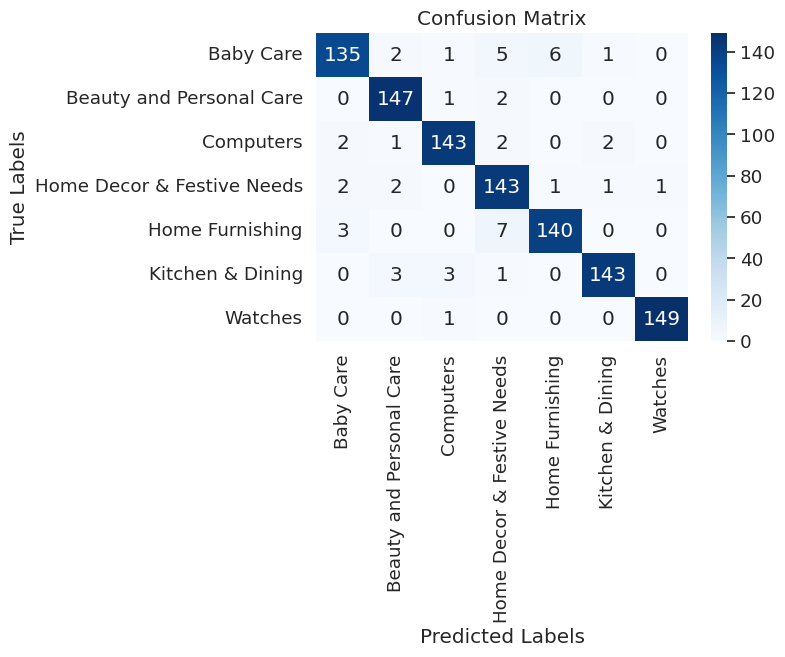

In [180]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "3100161"])

plt.figure(figsize=(6, 4))
sns.set(font_scale=1.2)

sns.heatmap(df_cm, annot=True, cmap="Blues", fmt="d", xticklabels=list_labels, yticklabels=list_labels)

plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

plt.show()

tsne1     -28.976048
tsne2      -5.509084
class        Watches
cluster            2
Name: 10, dtype: object


<ipython-input-181-e6c8893224f8>:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imread(filename)


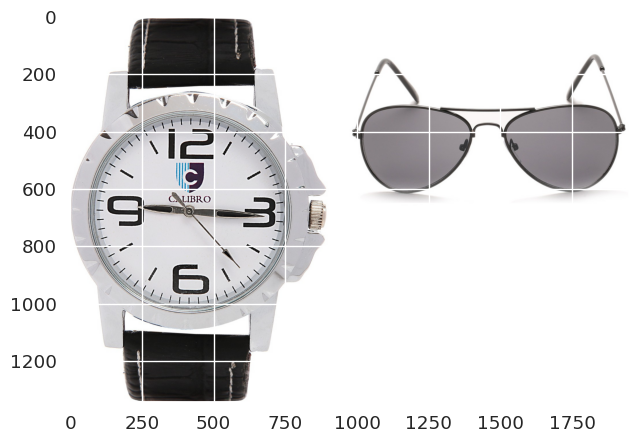

In [181]:
id = 10
print(df_tsne.iloc[id])
fig = plt.figure(figsize = (8, 5))
filename = img_sample["image"][id]
image = imread(filename)
plt.imshow(image)
plt.show()

# Traitement de texte

Nettoyage du texte - Stopwords - Stemming et Lemmatisation

In [182]:
train.to_csv('data_train.csv')
test.to_csv('data_test.csv')

In [183]:
# !pip install srsly==2.4.0

In [184]:
# !pip install gensim==3.6.0
# !pip install texthero==1.1.0

In [185]:
# pip install jedi==0.16

In [186]:
# pip install catalogue==0.0.7

In [187]:
# pip uninstall srsly --yes

In [188]:
# pip uninstall thinc --yes

In [189]:
# pip install -U pip setuptools wheel

In [190]:
# pip install srsly==2.4.0

In [191]:
pip install nlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 9.8 MB/s eta 0:00:00


In [192]:
# !pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.2.0/en_core_web_sm-2.2.0.tar.gz

In [193]:
# pip install whell

In [194]:
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets


In [195]:
import nltk
from string import punctuation
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

## Tester plusieurs techniques de nettoyage du texte

In [196]:
data.to_csv('saved_data_categories.csv',sep=',',index = True)

### cat_lvl_1

In [197]:
data['description'].describe()

count                                                  1050
unique                                                 1050
top       Key Features of Elegance Polyester Multicolor ...
freq                                                      1
Name: description, dtype: object

In [198]:
data['description'].value_counts().head(10)

Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you 

In [199]:
data['description'].value_counts(normalize=True)

Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you 

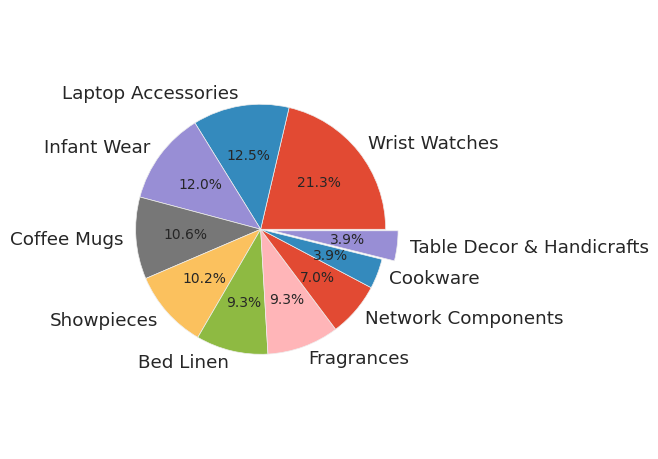

In [200]:
plt.style.use('ggplot')

dic = { 'Wrist Watches':                149,
        'Laptop Accessories':            87,
        'Infant Wear':                   84,
        'Coffee Mugs':                   74,
        'Showpieces':                    71,
        'Bed Linen':                     65,
        'Fragrances':                    65,
        'Network Components':            49,
        'Cookware':                      27,
        'Table Decor & Handicrafts':     27}

import itertools
newdic={}
for key, group in itertools.groupby(dic, lambda k: 'All the rest' if (dic[k]<2) else k):
     newdic[key] = sum([dic[k] for k in list(group)])

labels = dic.keys()
sizes = dic.values()

fig, ax = plt.subplots()


ax.pie(sizes, labels=labels, autopct='%1.1f%%', explode=(0,0,0,0,0,0,0,0,0,0.1), startangle=0)
ax.axis('equal')
plt.tight_layout()

plt.show()

**Lengh**

In [201]:
data.describe(include='object')

,uniq_id,crawl_timestamp,product_url,product_name,pid,image,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049,1050,1050,1050
unique,1050,149,1050,1050,1050,1050,1050,27,27,490,984,7,62,242
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va...",Home Furnishing,Wrist Watches,Deodorants
freq,1,150,1,1,1,1,1,889,889,11,22,150,149,65


<Axes: >

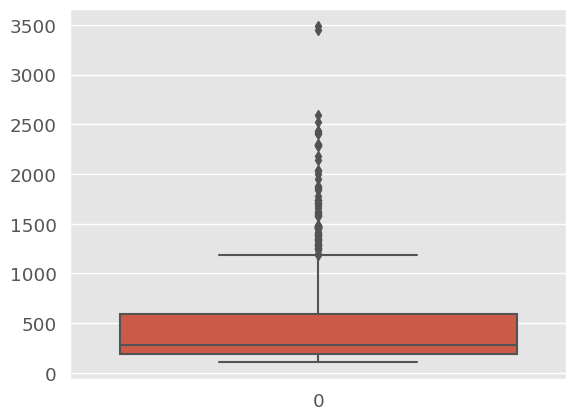

In [202]:
# vector numerique

import seaborn as sns

tmp = data.description.str.len()
sns.boxplot(tmp)

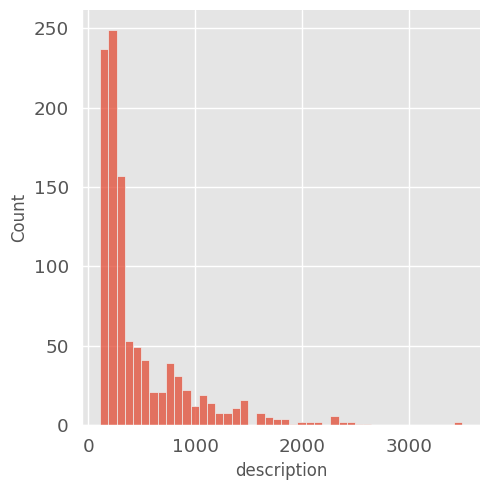

In [203]:
sns.displot(tmp)

In [204]:
# create column with len txt
data["_len_txt"] = tmp
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3,_len_txt
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains,1420
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels,444
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels,1258
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets,858
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets,1197


### Explore corpus

In [205]:
# visualisation of 20 random lines of the df
data_samp = data.sample(20)
data_samp

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat_lvl_1,cat_lvl_2,cat_lvl_3,_len_txt
261,273982a65b9c7dabe56c8345552bfad7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/pristine-hard-anodised...,Pristine Hard Anodised Kadhai 2 L,PTPE7FFJTHJDMDB5,1260.0,899.0,273982a65b9c7dabe56c8345552bfad7.jpg,False,Pristine Hard Anodised Kadhai 2 L (Aluminium)\...,No rating available,No rating available,Pristine,"{""product_specification""=>[{""key""=>""Pan Type"",...",Kitchen & Dining,Cookware,Pots & Pans,1597
869,d218c32df572e82db50faecd62179db2,2015-12-20 08:26:17 +0000,http://www.flipkart.com/homec-geometric-cushio...,Homec Geometric Cushions Cover,CPCECFY5BYTYVSKE,1399.0,799.0,d218c32df572e82db50faecd62179db2.jpg,False,"Homec Geometric Cushions Cover (Pack of 10, 40...",No rating available,No rating available,Homec,"{""product_specification""=>[{""key""=>""Closure"", ...",Home Furnishing,"Cushions, Pillows & Covers",Cushion Covers,257
676,ce9cb60201f1cdc33e4b58d3583c7a5c,2015-12-31 09:19:31 +0000,http://www.flipkart.com/handloomhub-polyester-...,Handloomhub Polyester Baby Pink Self Design Ey...,CRNEE5ZS269N23JY,1899.0,1199.0,ce9cb60201f1cdc33e4b58d3583c7a5c.jpg,False,Buy Handloomhub Polyester Baby Pink Self Desig...,No rating available,No rating available,Handloomhub,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains,157
113,0ddc40c08d9a9bafc4d14eddd98db7c0,2016-04-23 02:17:20 +0000,http://www.flipkart.com/omic-poto-blue-1000-ml...,Omic Poto-Blue 1000 ml Sipper,BOTEEMN6NM57HSBU,999.0,549.0,0ddc40c08d9a9bafc4d14eddd98db7c0.jpg,False,Key Features of Omic Poto-Blue 1000 ml Sipper ...,3.8,3.8,Omic,"{""product_specification""=>[{""key""=>""Body Mater...",Kitchen & Dining,Containers & Bottles,Bottles & Sippers,1411
808,f9f9cd4297b6667488785c2794a754f5,2015-12-12 11:46:53 +0000,http://www.flipkart.com/mxofere-combo-jasmine-...,Mxofere Combo Jasmine Papaya Almond Honey Oran...,CBKEBVA88B8NEHGV,285.0,285.0,f9f9cd4297b6667488785c2794a754f5.jpg,False,Mxofere Combo Jasmine Papaya Almond Honey Oran...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Organic Ty...",Beauty and Personal Care,Combos and Kits,Mxofere Combos and Kits,1867
757,44a6d9f64668b004c3254f3904142064,2015-12-12 11:46:53 +0000,http://www.flipkart.com/svm-navratri-special-7...,SVM Navratri Special 7 Analog Watch - For Gir...,WATEB3ZEPX4XYBHG,2499.0,244.0,44a6d9f64668b004c3254f3904142064.jpg,False,SVM Navratri Special 7 Analog Watch - For Gir...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp...",Watches,Wrist Watches,SVM Wrist Watches,290
684,8396537a124f502d11ab99972c816129,2015-12-31 09:19:31 +0000,http://www.flipkart.com/oshea-herbals-uvshield...,Oshea Herbals UVSHIELD - Sunscreen Gel - SPF 2...,SNREYGHC2HC9FGMB,195.0,180.0,8396537a124f502d11ab99972c816129.jpg,False,Flipkart.com: Buy Oshea Herbals UVSHIELD - Sun...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"",...",Beauty and Personal Care,Body and Skin Care,Face Care,203
847,4f708bc74c4d29b2967dc38a1f5ae6d5,2015-12-29 05:07:38 +0000,http://www.flipkart.com/rock-rocket-desktop-ch...,Rock Rocket Desktop Charger 6950290687051 USB ...,USGECXHFRRHFGRG2,3199.0,2999.0,4f708bc74c4d29b2967dc38a1f5ae6d5.jpg,False,Buy Rock Rocket Desktop Charger 6950290687051 ...,1,1,Rock,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Computers,Laptop Accessories,USB Gadgets,238
763,fc93a41f31c4e997fbfcc5bd0a63ee65,2015-12-12 11:46:53 +0000,http://www.flipkart.com/perucci-pc-310-analog-...,Perucci PC-310 Analog Watch - For Men,WATE3FAGQZPGYYDN,2500.0,1395.0,fc93a41f31c4e997fbfcc5bd0a63ee65.jpg,False,Perucci PC-310 Analog Watch - For Men - Buy P...,2,2,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",Wa

**2.1 - Lower**

In [206]:
doc = data.description.sample(1)
doc= doc.values[0]
doc

'Buy Neyth Cotton Set of Towels at Rs. 170 at Flipkart.com. Only Genuine Products. Free Shipping. Cash On Delivery!'

**2.2 Tokenizaton**

In [207]:
# tokenize
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize #convert paragraph into words list
import re

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [208]:
tokens = word_tokenize(doc)
tokens

['Buy',
 'Neyth',
 'Cotton',
 'Set',
 'of',
 'Towels',
 'at',
 'Rs',
 '.',
 '170',
 'at',
 'Flipkart.com',
 '.',
 'Only',
 'Genuine',
 'Products',
 '.',
 'Free',
 'Shipping',
 '.',
 'Cash',
 'On',
 'Delivery',
 '!']

In [209]:
len(tokens)

24

In [210]:
len(set(tokens))

20

In [211]:
def display_tokens_info(tokens):
  """display info about the corpus"""

  print(f"nb tokens {len(tokens)}, nb tokens unique {len(set(tokens))}")
  print(tokens[:30])

In [212]:
# other tokenize
from nltk.tokenize import WordPunctTokenizer

tk = WordPunctTokenizer()

tokens = tk.tokenize(doc)
display_tokens_info(tokens)

nb tokens 26, nb tokens unique 21
['Buy', 'Neyth', 'Cotton', 'Set', 'of', 'Towels', 'at', 'Rs', '.', '170', 'at', 'Flipkart', '.', 'com', '.', 'Only', 'Genuine', 'Products', '.', 'Free', 'Shipping', '.', 'Cash', 'On', 'Delivery', '!']


**2.3 - stopwords**

In [213]:
import nltk

nltk.download("stopwords")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [214]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))

In [215]:
tokens = [w for w in tokens if w not in stop_words]
display_tokens_info(tokens)

nb tokens 23, nb tokens unique 19
['Buy', 'Neyth', 'Cotton', 'Set', 'Towels', 'Rs', '.', '170', 'Flipkart', '.', 'com', '.', 'Only', 'Genuine', 'Products', '.', 'Free', 'Shipping', '.', 'Cash', 'On', 'Delivery', '!']


In [216]:
# other tokenizer
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r"\w+")
tokens = tokenizer.tokenize(doc)
display_tokens_info(tokens)

nb tokens 20, nb tokens unique 19
['Buy', 'Neyth', 'Cotton', 'Set', 'of', 'Towels', 'at', 'Rs', '170', 'at', 'Flipkart', 'com', 'Only', 'Genuine', 'Products', 'Free', 'Shipping', 'Cash', 'On', 'Delivery']


In [217]:
# remove stopwords

tokens = [w for w in tokens if w not in stop_words]
display_tokens_info(tokens)

nb tokens 17, nb tokens unique 17
['Buy', 'Neyth', 'Cotton', 'Set', 'Towels', 'Rs', '170', 'Flipkart', 'com', 'Only', 'Genuine', 'Products', 'Free', 'Shipping', 'Cash', 'On', 'Delivery']


**Cleaning function**

In [218]:
def process_text_1 (doc, rejoin=False) :
  """ basic function of text processing """

  #lower
  doc = doc.lower().strip()

  #tokenize
  tokenizer = RegexpTokenizer(r"\w+")
  raw_tokens_list = tokenizer.tokenize(doc)

  # stop words
  cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]

  if rejoin :
    return " ".join(cleaned_tokens_list)

  return cleaned_tokens_list


In [219]:
tokens = process_text_1(doc)
display_tokens_info(tokens)

nb tokens 15, nb tokens unique 15
['buy', 'neyth', 'cotton', 'set', 'towels', 'rs', '170', 'flipkart', 'com', 'genuine', 'products', 'free', 'shipping', 'cash', 'delivery']


### Working on the entire corpus

In [220]:
# Join all corpus

raw_corpus = "".join(data.description.values)
raw_corpus

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [221]:
len(raw_corpus)

497512

In [222]:
# process the corpus

corpus = process_text_1(raw_corpus)
display_tokens_info(corpus)

nb tokens 61452, nb tokens unique 6165
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '213', 'cm', 'height', 'pack', '2', 'price', 'rs', '899', 'curtain', 'enhances', 'look', 'interiors']


In [223]:
# value counts

tmp = pd.Series(corpus).value_counts()
tmp

rs           911
products     631
free         618
delivery     567
cash         564
            ... 
drawerkey      1
680            1
roundbuy       1
homeehub       1
dell           1
Length: 6165, dtype: int64

In [224]:
# visualisation

# sns.barplot(x=tmp.index, y=tmp.values)

In [225]:
# 30 st most comun tokens

tmp.head(30)

rs                911
products          631
free              618
delivery          567
cash              564
genuine           564
shipping          564
replacement       559
buy               543
day               540
cm                532
1                 524
30                498
flipkart          475
guarantee         471
com               468
online            396
features          395
price             352
watch             329
color             328
baby              320
mug               318
pack              317
material          312
set               306
type              304
cotton            299
specifications    295
box               291
dtype: int64

In [226]:
tmp.describe()

count    6165.000000
mean        9.967883
std        38.897271
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       911.000000
dtype: float64

**3.3 List rare tokens**

In [227]:
tmp = pd.Series(corpus).value_counts()
list_unique_words = tmp[tmp==1]
list_unique_words[:30]

paraben         1
vinegar         1
glycol          1
oodles          1
ingredients     1
skip            1
bullshit        1
word            1
soapking        1
hop             1
arabicoudh      1
grass           1
students        1
979             1
leafs           1
vegetarian      1
length225       1
6645            1
quantities      1
sscp            1
582             1
appreciation    1
flawers         1
tulip           1
playing         1
balls           1
ballsech        1
repeatedly      1
pmr1918         1
pmba1872        1
dtype: int64

In [228]:
len(list_unique_words)

2114

In [229]:
list_unique_words = list(list_unique_words.index)
list_unique_words[:30]

['paraben',
 'vinegar',
 'glycol',
 'oodles',
 'ingredients',
 'skip',
 'bullshit',
 'word',
 'soapking',
 'hop',
 'arabicoudh',
 'grass',
 'students',
 '979',
 'leafs',
 'vegetarian',
 'length225',
 '6645',
 'quantities',
 'sscp',
 '582',
 'appreciation',
 'flawers',
 'tulip',
 'playing',
 'balls',
 'ballsech',
 'repeatedly',
 'pmr1918',
 'pmba1872']

In [230]:
# garder la list_unique_words.csv

tmp = pd.DataFrame({"words" : list_unique_words})
tmp.to_csv("list_unique_words.csv", index=False)

In [231]:
# idem for min 5 times

tmp = pd.Series(corpus).value_counts()
list_min_5_words = tmp[tmp<=5]
list_min_5_words[:30]

opener       5
dummy        5
marvel       5
ordinary     5
following    5
watche       5
belt         5
layers       5
trendnet     5
burner       5
fb           5
beach        5
moist        5
995          5
attention    5
vatika       5
strip        5
intel        5
across       5
colored      5
styling      5
appealing    5
polishes     5
serving      5
winter       5
lace         5
loves        5
320          5
fluffy       5
straps       5
dtype: int64

In [232]:
len(list_min_5_words)

4677

In [233]:
# garder list_min_5_words.csv

list_min_5_words = list(list_min_5_words.index)
tmp = pd.DataFrame({"words" : list_min_5_words})
tmp.to_csv("list_min_5_words.csv", index=False)

In [234]:
# idem for min 10 times

tmp = pd.Series(corpus).value_counts()
list_min_10_words = tmp[tmp<=10]
list_min_10_words[:30]

gum           10
modern        10
lid           10
residue       10
reusable      10
bluetooth     10
213           10
luxury        10
trimning      10
plug          10
deodorant     10
experience    10
pass          10
adjustable    10
creations     10
standard      10
stoneware     10
sparklings    10
slim          10
services      10
oudh          10
ganpati       10
5cms          10
glue          10
removal       10
crafts        10
intense       10
select        10
skins         10
asus          10
dtype: int64

In [235]:
len(list_min_10_words)

5302

In [236]:
# garder list_min_10_words.csv

list_min_10_words = list(list_min_10_words.index)
tmp = pd.DataFrame({"words" : list_min_10_words})
tmp.to_csv("list_min_10_words.csv", index=False)

 **3.3 Cleaning function**

In [237]:
def process_text_2(doc,
                   rejoin=False,
                   list_rare_words=None,
                   min_len_word=3,
                   force_is_alpha=True):
  """cf process_text_1 but with list_unique_words, min_len_word, and force_is_alpha

  positional arguments:
  ---------------------------------------------------

  opt args:
  ---------------------------------------------------
  rejoin : bool : if true return a sting else return the list of tokens
  list_rare_words : list: a list of rare words to exclude
  min_len_word : int : the minimum lengh of words to not exclude
  force_is_alpha : int : if 1, exclude all tokens with a numeric character

  return:
  ---------------------------------------------------
  a string (if rejoin is True) or a list of tokens
  """

  # list_unique_words
  if not list_rare_words:
    list_rare_words = []

  # lower
  doc = doc.lower().strip()

  # tokenize
  tokenizer = RegexpTokenizer(r"\w+")
  raw_tokens_list = tokenizer.tokenize(doc)

  #classic stopwords
  cleaned_tokens_list = [w for w in raw_tokens_list if w in stop_words]

  ##################################################
  ##################################################

  # no rare tokens
  non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

  # no more len words
  more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word ]

  # only alpha chars
  if force_is_alpha :
    alpha_tokens = [w for w in more_than_N if w.isalpha()]
  else :
    alpha_tokens = more_than_N

  ##################################################
  ##################################################
  if rejoin :
    return " ".join(alpha_tokens)

  return alpha_tokens


In [238]:
display_tokens_info(corpus)

nb tokens 61452, nb tokens unique 6165
['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '213', 'cm', 'height', 'pack', '2', 'price', 'rs', '899', 'curtain', 'enhances', 'look', 'interiors']


In [239]:
len(set(corpus))

6165

In [240]:
corpus = process_text_2(raw_corpus,
                        list_rare_words=list_unique_words,
                        rejoin=False)
display_tokens_info(corpus)

nb tokens 10712, nb tokens unique 88
['this', 'the', 'the', 'this', 'from', 'with', 'the', 'and', 'this', 'and', 'and', 'have', 'your', 'and', 'with', 'these', 'the', 'these', 'and', 'when', 'you', 'them', 'the', 'the', 'you', 'the', 'and', 'when', 'you', 'them']


In [241]:
len(set(corpus))

88

**3.5 Steam and Lem**

In [242]:
doc

'Buy Neyth Cotton Set of Towels at Rs. 170 at Flipkart.com. Only Genuine Products. Free Shipping. Cash On Delivery!'

In [243]:
tokenizer = RegexpTokenizer(r"\w+")
tokens = tokenizer.tokenize(doc.lower())
print(tokens)

['buy', 'neyth', 'cotton', 'set', 'of', 'towels', 'at', 'rs', '170', 'at', 'flipkart', 'com', 'only', 'genuine', 'products', 'free', 'shipping', 'cash', 'on', 'delivery']


In [244]:
from nltk.stem import PorterStemmer

trans = PorterStemmer()
trans_text = [trans.stem(i) for i in tokens ]
print(trans_text)

['buy', 'neyth', 'cotton', 'set', 'of', 'towel', 'at', 'rs', '170', 'at', 'flipkart', 'com', 'onli', 'genuin', 'product', 'free', 'ship', 'cash', 'on', 'deliveri']


In [245]:
from nltk.stem import WordNetLemmatizer

nltk.download('wordnet')

trans = WordNetLemmatizer()
trans_text = [trans.lemmatize(i) for i in tokens ]
print(trans_text)

[nltk_data] Downloading package wordnet to /root/nltk_data...


['buy', 'neyth', 'cotton', 'set', 'of', 'towel', 'at', 'r', '170', 'at', 'flipkart', 'com', 'only', 'genuine', 'product', 'free', 'shipping', 'cash', 'on', 'delivery']


**3.5 3rd cleaning function**

In [246]:
def process_text_3(doc,
                   rejoin=False,
                   lemm_or_stemm="stem",
                   list_rare_words=None,
                   min_len_word=3,
                   force_is_alpha=True):
  """cf process_text_2 but with stemm or lem

  positional arguments:
  ---------------------------------------------------
  doc : str : the document (aka a text in str format) to process

  opt args:
  ---------------------------------------------------
  rejoin : bool : if true return a sting else return the list of tokens
  lemm_or_stemm : str: if lem to lemmentize else stemmentize
  list_rare_words : list : a list of rare words to exclude
  min_len_word : int : the minimum lengh of words to not exclude
  force_is_alpha : int : if 1, exclude all tokens with a numeric character

  return:
  ---------------------------------------------------
  a string (if rejoin is True) or a list of tokens
  """

  # list_unique_words
  if not list_rare_words:
    list_rare_words = []

  # lower
  doc = doc.lower().strip()

  # tokenize
  tokenizer = RegexpTokenizer(r"\w+")
  raw_tokens_list = tokenizer.tokenize(doc)

  #classic stopwords
  cleaned_tokens_list = [w for w in raw_tokens_list if w in stop_words]

  ##################################################
  ##################################################

  # no rare tokens
  non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

  # no more len words
  more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word ]

  # only alpha chars
  if force_is_alpha :
    alpha_tokens = [w for w in more_than_N if w.isalpha()]
  else :
    alpha_tokens = more_than_N

  ##################################################
  ##################################################

  # stem or lem
  if lemm_or_stemm == "lem" :
      trans = WordNetLemmatizer()
      trans_text = [trans.lemmatize(i) for i in alpha_tokens ]
  else:
    trans = PorterStemmer()
    trans_text = [trans.stem(i) for i in alpha_tokens]

  ##################################################
  ##################################################

  # manage return type
  if rejoin :
    return " ".join(trans_text)

  return trans_text

In [247]:
# +/- 3s

corpus = process_text_3(raw_corpus,
                        list_rare_words=list_unique_words,
                        rejoin=False)
pd.Series(corpus).sample(30)

1905       can
9848       thi
363       will
8267      into
2661      your
1675      that
1427       and
532        the
5110       for
8536       are
3941       for
785         ha
3310       and
3643      with
3493       for
5619      onli
4842       and
10651     with
2787     other
814       your
10164      for
3039       for
8125       not
10498      our
9205       not
10711     onli
952       your
2944      they
2896       own
690        and
dtype: object

In [248]:
len(set(corpus))

86

In [249]:
display_tokens_info(corpus)

nb tokens 10712, nb tokens unique 86
['thi', 'the', 'the', 'thi', 'from', 'with', 'the', 'and', 'thi', 'and', 'and', 'have', 'your', 'and', 'with', 'these', 'the', 'these', 'and', 'when', 'you', 'them', 'the', 'the', 'you', 'the', 'and', 'when', 'you', 'them']


**3.5 Only english words**

In [250]:
from nltk.corpus import words

nltk.download('words')

pd.Series( words.words()).sample(30)

[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


112202          mataeology
92970      incompetentness
195906         swashbuckle
178562          septillion
202285        thirteenfold
202273         thirstiness
156533          profitably
190839        stridulatory
191386           Stylidium
22337               billot
79960             grenadin
199428             Telembi
131079             oomancy
146962              pineal
74200          funambulism
159104      Psittaciformes
45696        criticizingly
175518       scorbutically
192538       subpeduncular
36335         Cimmerianism
77204               giglet
16005     autobiographical
200576               teste
90804               ideist
2947            adventitia
31389          cataclastic
72541          forfication
210054           tyrannous
92031            impeticos
35914            chrysalis
dtype: object

In [251]:
len(set(words.words()))

235892

In [252]:
eng_words = [i.lower() for i in words.words() ]
eng_words

['a',
 'a',
 'aa',
 'aal',
 'aalii',
 'aam',
 'aani',
 'aardvark',
 'aardwolf',
 'aaron',
 'aaronic',
 'aaronical',
 'aaronite',
 'aaronitic',
 'aaru',
 'ab',
 'aba',
 'ababdeh',
 'ababua',
 'abac',
 'abaca',
 'abacate',
 'abacay',
 'abacinate',
 'abacination',
 'abaciscus',
 'abacist',
 'aback',
 'abactinal',
 'abactinally',
 'abaction',
 'abactor',
 'abaculus',
 'abacus',
 'abadite',
 'abaff',
 'abaft',
 'abaisance',
 'abaiser',
 'abaissed',
 'abalienate',
 'abalienation',
 'abalone',
 'abama',
 'abampere',
 'abandon',
 'abandonable',
 'abandoned',
 'abandonedly',
 'abandonee',
 'abandoner',
 'abandonment',
 'abanic',
 'abantes',
 'abaptiston',
 'abarambo',
 'abaris',
 'abarthrosis',
 'abarticular',
 'abarticulation',
 'abas',
 'abase',
 'abased',
 'abasedly',
 'abasedness',
 'abasement',
 'abaser',
 'abasgi',
 'abash',
 'abashed',
 'abashedly',
 'abashedness',
 'abashless',
 'abashlessly',
 'abashment',
 'abasia',
 'abasic',
 'abask',
 'abassin',
 'abastardize',
 'abatable',
 'abate

In [253]:
eng_words = [i.lower() for i in words.words()]
eng_words[:30]

['a',
 'a',
 'aa',
 'aal',
 'aalii',
 'aam',
 'aani',
 'aardvark',
 'aardwolf',
 'aaron',
 'aaronic',
 'aaronical',
 'aaronite',
 'aaronitic',
 'aaru',
 'ab',
 'aba',
 'ababdeh',
 'ababua',
 'abac',
 'abaca',
 'abacate',
 'abacay',
 'abacinate',
 'abacination',
 'abaciscus',
 'abacist',
 'aback',
 'abactinal',
 'abactinally']

In [254]:
len(set(eng_words))

234377

In [255]:
ps = PorterStemmer()
eng_words_stem = [ps.stem(i) for i in eng_words]
display_tokens_info(eng_words_stem)

nb tokens 236736, nb tokens unique 178311
['a', 'a', 'aa', 'aal', 'aalii', 'aam', 'aani', 'aardvark', 'aardwolf', 'aaron', 'aaron', 'aaron', 'aaronit', 'aaronit', 'aaru', 'ab', 'aba', 'ababdeh', 'ababua', 'abac', 'abaca', 'abac', 'abacay', 'abacin', 'abacin', 'abaciscu', 'abacist', 'aback', 'abactin', 'abactin']


In [256]:
len(set(eng_words_stem))

178311

In [257]:
lm = WordNetLemmatizer()
eng_words_lem = [lm.lemmatize(i) for i in eng_words]
display_tokens_info(eng_words_lem)

nb tokens 236736, nb tokens unique 233450
['a', 'a', 'aa', 'aal', 'aalii', 'aam', 'aani', 'aardvark', 'aardwolf', 'aaron', 'aaronic', 'aaronical', 'aaronite', 'aaronitic', 'aaru', 'ab', 'aba', 'ababdeh', 'ababua', 'abac', 'abaca', 'abacate', 'abacay', 'abacinate', 'abacination', 'abaciscus', 'abacist', 'aback', 'abactinal', 'abactinally']


In [258]:
len(eng_words_lem)

236736

**3.6 - 4th cleaning function**

In [259]:
def process_text_4(doc,
                   rejoin=False,
                   lemm_or_stemm="stem",
                   list_rare_words=None,
                   min_len_word=3,
                   force_is_alpha=True,
                   eng_words=None) :
  """cf process_text_2 but with stemm or lem

  positional arguments:
  ---------------------------------------------------
  doc : str : the document (aka a text in str format) to process

  opt args:
  ---------------------------------------------------
  rejoin : bool : if true return a sting else return the list of tokens
  lemm_or_stemm : str: if lem to lemmentize else stemmentize
  list_rare_words : list : a list of rare words to exclude
  min_len_word : int : the minimum lengh of words to not exclude
  force_is_alpha : int : if 1, exclude all tokens with a numeric character
  eng_words : list : list of english words

  return:
  ---------------------------------------------------
  a string (if rejoin is True) or a list of tokens
  """

  # list_unique_words
  if not list_rare_words:
    list_rare_words = []

  # lower
  doc = doc.lower().strip()

  # tokenize
  tokenizer = RegexpTokenizer(r"\w+")
  raw_tokens_list = tokenizer.tokenize(doc)

  #classic stopwords
  cleaned_tokens_list = [w for w in raw_tokens_list if w in stop_words]

  ##################################################
  ##################################################

  # no rare tokens
  non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

  # no more len words
  more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word ]

  # only alpha chars
  if force_is_alpha :
    alpha_tokens = [w for w in more_than_N if w.isalpha()]
  else :
    alpha_tokens = more_than_N

  ##################################################
  ##################################################

  # stem or lem
  if lemm_or_stemm == "lem" :
      trans = WordNetLemmatizer()
      trans_text = [trans.lemmatize(i) for i in alpha_tokens ]
  else:
    trans = PorterStemmer()
    trans_text = [trans.stem(i) for i in alpha_tokens]

  ##################################################
  ##################################################

  # in english
  if eng_words :
    engl_text = [i for i in trans_text if i in eng_words]
  else :
    engl_text = trans_text

  ##################################################
  ##################################################

  # return a list or a string
  if rejoin :
    return " ".join(engl_text)

  return engl_text

In [260]:
# +/- 50
corpus = process_text_4(raw_corpus,
                        list_rare_words=list_unique_words,
                        rejoin=False,
                        eng_words=eng_words_stem)
display_tokens_info(corpus)

nb tokens 10710, nb tokens unique 85
['thi', 'the', 'the', 'thi', 'from', 'with', 'the', 'and', 'thi', 'and', 'and', 'have', 'your', 'and', 'with', 'these', 'the', 'these', 'and', 'when', 'you', 'them', 'the', 'the', 'you', 'the', 'and', 'when', 'you', 'them']


4.3 5th cleaning function

In [261]:
def process_text_5(doc,
                   rejoin=False,
                   lemm_or_stemm="stem",
                   list_rare_words=None,
                   min_len_word=3,
                   force_is_alpha=True,
                   eng_words=None,
                   extra_words=None) :
  """df v4 but exclude an extra list"""

  # list_unique_words
  if not list_rare_words:
    list_rare_words = []

  # extra_words
  if not extra_words:
    extra_words = []

  # lower and strip
  doc = doc.lower().strip()

  # tokenize
  tokenizer = RegexpTokenizer(r"\w+")
  raw_tokens_list = tokenizer.tokenize(doc)

  #classic stopwords
  cleaned_tokens_list = [w for w in raw_tokens_list if w in stop_words]

  ##################################################
  ##################################################

  # no rare tokens
  non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

  # no more len words
  more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word ]

  # only alpha chars
  if force_is_alpha :
    alpha_tokens = [w for w in more_than_N if w.isalpha()]
  else :
    alpha_tokens = more_than_N

  ##################################################
  ##################################################

  # stem or lem
  if lemm_or_stemm == "lem" :
      trans = WordNetLemmatizer()
      trans_text = [trans.lemmatize(i) for i in alpha_tokens ]
  else:
    trans = PorterStemmer()
    trans_text = [trans.stem(i) for i in alpha_tokens]

  ##################################################
  ##################################################

  # in english
  if eng_words :
    engl_text = [i for i in trans_text if i in eng_words]
  else :
    engl_text = trans_text

  ##################################################
  ##################################################

  # drop extra_words tokens
  final = [w for w in engl_text if w not in extra_words]

  ##################################################
  ##################################################

  # return a list or a string
  if rejoin :
    return " ".join(engl_text)

  return engl_text

5 . Final cleaned_data.csv

In [262]:
def final_clean(doc) :
    """perform our final clenaing """

    new_doc = process_text_5(doc,
                              rejoin=False,
                              lemm_or_stemm="stem",
                              list_rare_words=list_min_5_words,
                              eng_words=eng_words_stem,
                              extra_words=None)

    return new_doc

In [263]:
!pip install pandarallel

  Preparing metadata (setup.py) ... done
  Created wheel for pandarallel: filename=pandarallel-1.6.5-py3-none-any.whl size=16672 sha256=4543aa2353dd8c3024aac8ffc8e161c52516263bd3761e9523f9af654bdd2cd1
  Stored in directory: /root/.cache/pip/wheels/50/4f/1e/34e057bb868842209f1623f195b74fd7eda229308a7352d47f
Successfully built pandarallel


In [264]:
from pandarallel import pandarallel
pandarallel.initialize()

INFO: Pandarallel will run on 20 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [265]:
pandarallel.initialize(progress_bar=True)

# data.cat_lvl_1.apply(final_clean)
data.description.apply(final_clean)

# data['clean_text'] = data['cat_lvl_1'].parallel_apply(final_clean)
data['clean_discription']= data['description'].parallel_apply(final_clean)

INFO: Pandarallel will run on 20 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [266]:
data['clean_discription']

0       [thi, the, the, thi, from, with, the, and, thi...
1                                              [for, the]
2       [you, all, our, have, that, your, and, you, th...
3                                   [for, with, not, the]
4       [thi, you, thi, thi, your, and, it, and, thi, ...
                              ...                        
1045    [can, for, the, there, that, can, thi, will, t...
1046    [thi, your, are, the, the, and, and, your, onl...
1047                                    [for, with, onli]
1048                                    [for, with, onli]
1049                                    [for, with, onli]
Name: clean_discription, Length: 1050, dtype: object

In [267]:
t_text = data["description"].values.tolist()

In [268]:
# importing Counter module
from collections import Counter

Counter(t_text).keys()

dict_keys(['Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room 

In [269]:
from nltk.stem.snowball import SnowballStemmer

stemmer = SnowballStemmer('english')

def stemmatize_text(t_text):
    # On découpe le texte au niveau de tout ce qu'il est différent de lettre, pour obtenir des tokens
    pattern_lettres = r"[^\w]+"
    tokens = re.split(pattern_lettres, t_text.lower())

    # On stemmatize chaque token obtenu sil n'est pas dans le stopwords
    new_tokens = [stemmer.stem(tok) for tok in tokens if tok not in set(stopwords.words('english'))]

    # On refait le texte à partir de nouveaux tokens, en les separant par des espaces
    new_text = " ".join(new_tokens)

    return new_text

In [270]:
t_text = [stemmatize_text(t) for t in t_text]

## Analyse exploratoire des données

### BagofWords avec CountVectorizer

In [271]:
# Cleaning the texts
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

ps = PorterStemmer()
wordnet=WordNetLemmatizer()

corpus = []

for i in range(0, len(data)):
    review = re.sub('[^a-zA-Z]', ' ', data["description"][i])
    review = review.lower()
    review = review.split()

    review = [ps.stem(word) for word in review if not word in set(stopwords.words('english'))]
    review = ' '.join(review)
    corpus.append(review)

In [272]:
corpus[3]

'key featur santosh royal fashion cotton print king size doubl bedsheet royal bedsheet perfact wed gift specif santosh royal fashion cotton print king size doubl bedsheet bedsheet pillow cover multicolor gener brand santosh royal fashion machin washabl ye type flat materi cotton model name gold design royal cotton print wed gift doubl bedsheet pillow cover model id goldbedi color multicolor size king fabric care machin wash bleach dimens flat sheet width inch cm fit sheet width cm pillow cover width inch cm pillow cover length inch cm fit sheet depth cm fit sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale packag sale packag bedsheet pillow cover'

In [273]:
#Apply Countvectorizer
# Creating the Bag of Words model
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_features = 1500)
X = cv.fit_transform(corpus).toarray()


# convert to categorical values
# y=pd.get_dummies(data['cat_lvl_1'])
# y=y.iloc[:,1].values
y=np.where(np.array(pd.get_dummies(data['cat_lvl_1']))==1)[1]


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [274]:
X_train

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [275]:
# see the top 20 features names
cv.get_feature_names_out()[:20]

array(['aapno', 'aari', 'abkl', 'abl', 'absorb', 'abstract', 'ac',
       'accessori', 'accord', 'across', 'actual', 'ad', 'adapt',
       'adaptor', 'add', 'addit', 'adhes', 'adida', 'adjust', 'admir'],
      dtype=object)

In [276]:
cv.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.int64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 1500,
 'min_df': 1,
 'ngram_range': (1, 1),
 'preprocessor': None,
 'stop_words': None,
 'strip_accents': None,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'vocabulary': None}

In [277]:
df_bag = pd.DataFrame(X_train, columns=cv.get_feature_names_out())
df_bag.head()

,aapno,aari,abkl,abl,absorb,abstract,ac,accessori,accord,across,...,yarn,ye,year,yellow,yet,yg,yl,ym,youth,zone
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [278]:
import matplotlib.pyplot as plt

In [279]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    See full source and example:
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [280]:
results_df = pd.DataFrame()

#### Classification - MultinomialNB Algorithm

In [281]:
# Training model using Naive bayes classifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.metrics import accuracy_score

# Training model using Naive Bayes classifier
label_detect_model = MultinomialNB().fit(X_train, y_train)

# Predicting on the test set
y_pred=label_detect_model.predict(X_test)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

In [282]:
from sklearn.metrics import confusion_matrix
confusion_m=confusion_matrix(y_test,y_pred)

print("Confusion Matrix:")
print(confusion_m)

Confusion Matrix:
[[20  1  1  4  9  0  1]
 [ 1 29  0  1  0  0  0]
 [ 0  0 22  0  0  0  4]
 [ 0  0  0 25  0  0  0]
 [ 0  0  0  0 35  0  0]
 [ 1  6  0  2  0 14  0]
 [ 0  0  0  0  0  0 34]]


In [283]:
# Update the value in the DataFrame
results_df.at["NB", "countVectorizer"] = accuracy
results_df

,countVectorizer
NB,0.852381


accuracy: 0.852
Confusion matrix, without normalization


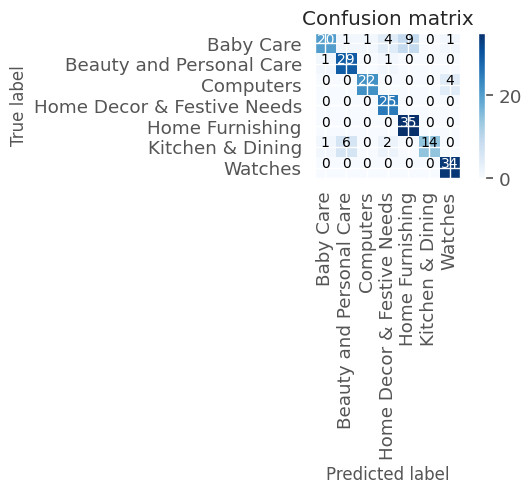

In [284]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay

accuracy=accuracy_score(y_test,y_pred)
print("accuracy: %0.3f" % accuracy)

cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes=pd.get_dummies(data['cat_lvl_1']).columns)

#### Classification RF

In [285]:
# RANDOM_FORES_CLASSFIER
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(n_estimators=25, max_depth=15,random_state=42)

# Training model
rf_clf=rf_clf.fit(X=X_train,y=y_train)

# Predicting on the test set
y_pred=rf_clf.predict(X_test)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

In [286]:
results_df.at["RF" , "countVectorizer"] = accuracy
results_df

,countVectorizer
NB,0.852381
RF,0.919048


#### Classification - MLP

In [287]:
from sklearn.neural_network import MLPClassifier
#MLP_CLASSIFIER
mlp_clf = MLPClassifier(solver='lbfgs', alpha=1e-4,hidden_layer_sizes=(20,10, 2), random_state=42)

# Training model
mlp_clf.fit(X=X_train,y=y_train)

# Predicting on the test set
y_pred=mlp_clf.predict(X_test)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

In [288]:
results_df.at["MLP" , "countVectorizer"] = accuracy
results_df

,countVectorizer
NB,0.852381
RF,0.919048
MLP,0.109524


 CLASSIFIERS ACCURACY COMPARISON ON COUNT_VECTORIZER

In [289]:
results_df

,countVectorizer
NB,0.852381
RF,0.919048
MLP,0.109524


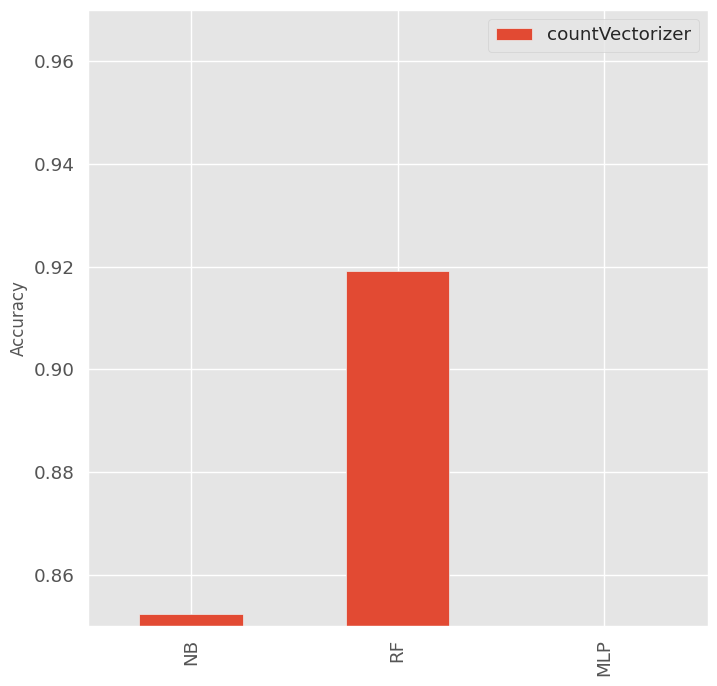

In [290]:
fig,axes=plt.subplots(1,1,figsize=(8,8))
axes.set_ylabel("Accuracy")
plt.ylim((.85,.97))
results_df.plot(kind="bar",ax=axes);

Bag of words avec CountVectorizer

In [291]:
# # creating the bag of words model
# from sklearn.feature_extraction.text import CountVectorizer

# cv = CountVectorizer()
# X = cv.fit_transform(t_text).toarray()
# features = cv.get_feature_names_out()

# # affiche les 20 premiers features
# print(features[0:20])

# print("")

# #On affiche aussi le nombre total de tokens uniques :
# print("Nombre de tokens uniques:", len(features))

In [292]:
# #create dataframe
# cv_dataframe=pd.DataFrame( X , columns=cv.get_feature_names_out())
# print(cv_dataframe)

### BagOfWords avec TF-IDF

In [293]:
data = data.copy()

In [294]:
import nltk

# cleaning text
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

ps = PorterStemmer()
wordnet = WordNetLemmatizer()
corpus = []

for i in range(0, len(data)):
    review = re.sub('[^a-zA-Z]', ' ', data['description'][i])
    review = review.lower()
    review = review.split()

    review = [ps.stem(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

In [295]:
corpus[3]

'key featur santosh royal fashion cotton print king size doubl bedsheet royal bedsheet perfact wed gift specif santosh royal fashion cotton print king size doubl bedsheet bedsheet pillow cover multicolor gener brand santosh royal fashion machin washabl ye type flat materi cotton model name gold design royal cotton print wed gift doubl bedsheet pillow cover model id goldbedi color multicolor size king fabric care machin wash bleach dimens flat sheet width inch cm fit sheet width cm pillow cover width inch cm pillow cover length inch cm fit sheet depth cm fit sheet length cm flat sheet depth cm flat sheet length inch cm box number content sale packag sale packag bedsheet pillow cover'

In [296]:
# Creating the TF-IDF model
from sklearn.feature_extraction.text import TfidfVectorizer
cv = TfidfVectorizer(max_features=5000)
X = cv.fit_transform(corpus).toarray()

In [297]:
X.shape

(1050, 4083)

In [298]:
# convert to categorical values
#y=pd.get_dummies(data['cat_lvl_1'])
#y=y.iloc[:,1].values
y=np.where(np.array(pd.get_dummies(data['cat_lvl_1']))==1)[1]

In [299]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

In [300]:
cv.get_feature_names_out()[:20]

array(['aa', 'aaa', 'aapno', 'aari', 'aarika', 'abil', 'abkl', 'abl',
       'abod', 'abras', 'abroad', 'absolut', 'absorb', 'abstract',
       'abstrct', 'ac', 'accent', 'access', 'accessori', 'accid'],
      dtype=object)

In [301]:
cv.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.float64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 1),
 'norm': 'l2',
 'preprocessor': None,
 'smooth_idf': True,
 'stop_words': None,
 'strip_accents': None,
 'sublinear_tf': False,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'use_idf': True,
 'vocabulary': None}

In [302]:
df_tf = pd.DataFrame(X_train, columns=cv.get_feature_names_out())

In [303]:
df_tf.head()

,aa,aaa,aapno,aari,aarika,abil,abkl,abl,abod,abras,...,zikrak,zinc,zingalalaa,zip,zipexterior,zipper,zone,zoom,zora,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [304]:
import matplotlib.pyplot as plt

In [305]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    See full source and example:
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

#### Classifieur - MultinomialNB Algorithm

In [306]:
y_train.shape

(840,)

In [307]:
# Training model using Naive bayes classifier

from sklearn.naive_bayes import MultinomialNB
label_detect_model = MultinomialNB().fit(X_train, y_train)

y_pred=label_detect_model.predict(X_test)

In [308]:
from sklearn.metrics import confusion_matrix
confusion_m=confusion_matrix(y_test,y_pred)

print(confusion_m)

[[22  2  1  2  9  0  0]
 [ 1 29  0  1  0  0  0]
 [ 0  2 24  0  0  0  0]
 [ 0  0  0 25  0  0  0]
 [ 0  0  0  0 35  0  0]
 [ 1  1  0  0  0 21  0]
 [ 0  0  0  0  0  0 34]]


In [309]:
# good accuracy score
from sklearn.metrics import accuracy_score
accuracy=accuracy_score(y_test,y_pred)
print(accuracy)

0.9047619047619048


In [310]:
results_df.at["NB", "Tf-IDF"] = accuracy
results_df

,countVectorizer,Tf-IDF
NB,0.852381,0.904762
RF,0.919048,NaN
MLP,0.109524,NaN


In [311]:
pd.get_dummies(data['cat_lvl_1'])

,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
0,0,0,0,0,1,0,0
1,1,0,0,0,0,0,0
2,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0
4,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...
1045,1,0,0,0,0,0,0
1046,1,0,0,0,0,0,0
1047,1,0,0,0,0,0,0
1048,1,0,0,0,0,0,0


accuracy:   0.905
Confusion matrix, without normalization


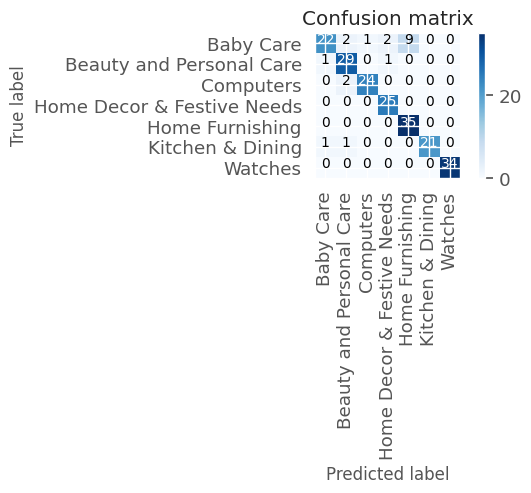

In [312]:
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.naive_bayes import MultinomialNB
classifier=MultinomialNB()
classifier.fit(X_train, y_train)
pred = classifier.predict(X_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred)
plot_confusion_matrix(cm, classes=pd.get_dummies(data['cat_lvl_1']).columns)


In [313]:
#create dataframe
cv_dataframe=pd.DataFrame( X , columns=cv.get_feature_names_out())
print(cv_dataframe.head(2))

    aa  aaa  aapno  aari  aarika  abil  abkl  abl  abod  abras  ...  zikrak  \
0  0.0  0.0    0.0   0.0     0.0   0.0   0.0  0.0   0.0    0.0  ...     0.0   
1  0.0  0.0    0.0   0.0     0.0   0.0   0.0  0.0   0.0    0.0  ...     0.0   

   zinc  zingalalaa  zip  zipexterior  zipper  zone  zoom  zora  zyxel  
0   0.0         0.0  0.0          0.0     0.0   0.0   0.0   0.0    0.0  
1   0.0         0.0  0.0          0.0     0.0   0.0   0.0   0.0    0.0  

[2 rows x 4083 columns]


#### Classification MLP

In [314]:
from sklearn.neural_network import MLPClassifier
#MLP_CLASSIFIER
mlp_clf = MLPClassifier(solver='lbfgs', alpha=1e-4,hidden_layer_sizes=(20,10, 2), random_state=42)

# Training model
mlp_clf.fit(X=X_train,y=y_train)

# Predicting on the test set
y_pred=mlp_clf.predict(X_test)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

In [315]:
results_df.at["MLP" , "TF-IDF"] = accuracy
results_df

,countVectorizer,Tf-IDF,TF-IDF
NB,0.852381,0.904762,NaN
RF,0.919048,NaN,NaN
MLP,0.109524,NaN,0.109524


#### Tfidf classifieur RandomForest

In [316]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer()

X = tfidf.fit_transform(t_text)

# print(X)

In [317]:
cv = TfidfVectorizer()
cv.fit(t_text)
features = cv.get_feature_names_out()

# On affiche les 20 premiers tokens
print(features[0:20])

#On affiche aussi le nombre total de tokens uniques :
print("Nombre de tokens uniques:", len(features))

['00' '000' '001' '0021' '004' '005' '006' '0083' '01' '011' '01433cmgi'
 '01727lpln' '01741lpln' '01784bmli' '02' '03' '03918cmli' '04'
 '04615cmgi' '050']
Nombre de tokens uniques: 4943


In [318]:
# on garde uniquement les tokens construit des letters  et ont exclue des stop words aussi

pattern_lettres = r"(?u)\b[a-zA-Z][a-zA-Z]+\b"
sw = stopwords.words('english')
cv = TfidfVectorizer(token_pattern=pattern_lettres, stop_words=sw, min_df=5)

In [319]:
# ont passe de 4229 tokens a 913 apres le traitement
cv.fit(t_text)
features = cv.get_feature_names_out().tolist()
features.append("zzz")
print(features)
print("Nombre de tokens uniques:", len(features))

['absorb', 'abstract', 'ac', 'accessori', 'actual', 'adapt', 'add', 'addit', 'adhes', 'adida', 'adjust', 'ador', 'adorn', 'afford', 'age', 'air', 'akup', 'alarm', 'allow', 'almond', 'aloevera', 'along', 'also', 'aluminium', 'alway', 'amaz', 'analog', 'andr', 'android', 'anim', 'anna', 'anoth', 'anti', 'antiqu', 'apparel', 'appeal', 'appear', 'appl', 'appli', 'applic', 'area', 'aroma', 'around', 'art', 'artifici', 'artisan', 'artist', 'assembl', 'assort', 'assur', 'asus', 'attitud', 'attract', 'audio', 'authent', 'avail', 'away', 'awesom', 'babi', 'back', 'bag', 'band', 'bank', 'base', 'basic', 'bath', 'batteri', 'beauti', 'beautiful', 'bed', 'bedroom', 'bedsheet', 'beig', 'belt', 'best', 'better', 'big', 'birthday', 'black', 'blade', 'blanket', 'bleach', 'blend', 'blue', 'bodi', 'bodysuit', 'booti', 'bottl', 'bottom', 'bowl', 'box', 'boy', 'brand', 'brass', 'break', 'bright', 'bring', 'broadcast', 'brown', 'brush', 'bubbl', 'buckl', 'buddha', 'bulb', 'busi', 'button', 'buy', 'cabl', 'c

In [320]:
t_text[0]

'key featur eleg polyest multicolor abstract eyelet door curtain floral curtain eleg polyest multicolor abstract eyelet door curtain 213 cm height pack 2 price rs 899 curtain enhanc look interior curtain made 100 high qualiti polyest fabric featur eyelet style stitch metal ring make room environ romant love curtain ant wrinkl anti shrinkag eleg appar give home bright modernist appeal design surreal attent sure steal heart contemporari eyelet valanc curtain slide smooth draw apart first thing morn welcom bright sun ray want wish good morn whole world draw close even creat special moment joyous beauti given sooth print bring home eleg curtain soft filter light room get right amount sunlight specif eleg polyest multicolor abstract eyelet door curtain 213 cm height pack 2 general brand eleg design door type eyelet model name abstract polyest door curtain set 2 model id duster25 color multicolor dimens length 213 cm box number content sale packag pack 2 sale packag 2 curtain bodi design mat

In [321]:
cv = TfidfVectorizer(token_pattern=pattern_lettres, vocabulary=features, stop_words=sw, min_df=5)

In [322]:
cv.fit(t_text)

TfidfVectorizer(min_df=5,
                stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'ours',
                            'ourselves', 'you', "you're", "you've", "you'll",
                            "you'd", 'your', 'yours', 'yourself', 'yourselves',
                            'he', 'him', 'his', 'himself', 'she', "she's",
                            'her', 'hers', 'herself', 'it', "it's", 'its',
                            'itself', ...],
                token_pattern='(?u)\\b[a-zA-Z][a-zA-Z]+\\b',
                vocabulary=['absorb', 'abstract', 'ac', 'accessori', 'actual',
                            'adapt', 'add', 'addit', 'adhes', 'adida', 'adjust',
                            'ador', 'adorn', 'afford', 'age', 'air', 'akup',
                            'alarm', 'allow', 'almond', 'aloevera', 'along',
                            'also', 'aluminium', 'alway', 'amaz', 'analog',
                            'andr', 'android', 'anim', ...])

In [323]:
idf = cv.idf_
print(len(idf))
print(idf)

914
[5.5596021  4.15083488 5.24944717 5.01305839 5.06712561 5.06712561
 4.37397843 3.42489788 6.01158722 6.1657379  5.65491228 5.18490865
 6.01158722 5.24944717 5.12428403 5.5596021  6.1657379  6.01158722
 5.5596021  5.65491228 6.01158722 6.01158722 3.72339087 5.31844004
 6.1657379  5.76027279 3.07469545 6.1657379  5.87805583 5.65491228
 6.1657379  6.01158722 5.65491228 5.47259072 5.87805583 5.47259072
 5.76027279 5.47259072 4.73862155 5.87805583 5.06712561 5.39254801
 5.06712561 4.69940083 6.01158722 5.65491228 5.31844004 6.01158722
 6.1657379  5.31844004 5.87805583 6.1657379  4.73862155 5.47259072
 5.24944717 4.73862155 5.87805583 6.1657379  3.36237752 4.21982775
 5.12428403 5.76027279 5.87805583 4.86645492 6.01158722 4.55629999
 4.15083488 3.69481749 6.01158722 4.9617651  5.18490865 5.39254801
 6.01158722 6.01158722 2.58685934 6.1657379  6.01158722 5.87805583
 3.65343228 6.1657379  4.59020154 4.37397843 5.87805583 3.81436264
 3.70900213 5.87805583 6.01158722 4.82200315 5.5596021  6.

In [324]:
text2 = t_text
text_sparse_matrix = cv.transform(text2)
text_sparse_matrix.toarray()

array([[0.        , 0.18435271, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.07688859, 0.        ,
        0.        ],
       [0.0631574 , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [325]:
res = cv.transform(t_text)
# print(res)

Prediction

In [326]:
# On veut maintenant utiliser notre matrice pour faire une classification. Notre target se trouve dans le dataframe d'entrée, on le sauve dans la variable Y:

In [327]:
# convert into categorical values
Y=pd.get_dummies(data['cat_lvl_1'])

In [328]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=200, criterion='entropy')
clf.fit(text_sparse_matrix, Y)

RandomForestClassifier(criterion='entropy', n_estimators=200)

In [329]:
# predict for training dataset
prediction = clf.predict(text_sparse_matrix)

In [330]:
# very very good scrore
clf.score(text_sparse_matrix, Y)

0.9933333333333333

In [331]:
## Import library to check accuracy
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [332]:
vect = TfidfVectorizer(stop_words="english", analyzer="word", ngram_range=(1,2))
Tfidf_mat = vect.fit_transform(data.cat_lvl_1.astype(str))
feature_names = vect.get_feature_names_out()
dense = Tfidf_mat.todense()
denselist = dense.tolist()
data2 = pd.DataFrame(denselist, columns=feature_names)
data2.head()

,baby,baby care,beauty,beauty personal,care,computers,decor,decor festive,dining,festive,...,furnishing,home,home decor,home furnishing,kitchen,kitchen dining,needs,personal,personal care,watches
0,0.000000,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.621873,0.47597,0.0,0.621873,0.0,0.0,0.0,0.0,0.0,0.0
1,0.621873,0.621873,0.0,0.0,0.47597,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0.621873,0.621873,0.0,0.0,0.47597,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.00000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.621873,0.47597,0.0,0.621873,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,...,0.621873,0.47597,0.0,0.621873,0.0,0.0,0.0,0.0,0.0,0.0


## Deep Learning Trainning Model Technique


### Word2Vec
### Maintain the meaning of the different words

In [333]:
import gensim
from gensim import models
from gensim.models import Word2Vec, keyedvectors
from nltk.stem import WordNetLemmatizer

In [334]:
lemmatizer=WordNetLemmatizer()

In [335]:
# using lemmatizer
corpus = []
for i in range(0, len(data)):
    review = re.sub('[^a-zA-Z]', ' ', data['description'][i])
    review = review.lower()
    review = review.split()

    review = [lemmatizer.lemmatize(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)
    corpus.append(review)

In [336]:
[[i,j,k] for i,j,k in zip(list(map(len,corpus)),corpus, data['description']) if i<1]

[]

In [337]:
len(corpus[1])

387

In [338]:
from nltk import sent_tokenize
from gensim.utils import simple_preprocess #convert into lower case tokens ignoring too long or too short tokens

In [339]:
words=[]
for sent in corpus:
    sent_token=nltk.sent_tokenize(sent)
    for sent in sent_token:
        words.append(simple_preprocess(sent))

In [340]:
words[1][10]

'bath'

In [341]:
import gensim

In [342]:
## Train Word2vec from scratch
model=gensim.models.Word2Vec(words,epochs=1000)

In [343]:
# all the vocabolary
model.wv.index_to_key
1

1

In [344]:
model.corpus_count

1050

In [345]:
# the more epochs the better
model.epochs

1000

In [346]:
# similar words to kid
model.wv.similar_by_word('kid')

[('bodysuit', 0.31237876415252686),
 ('printland', 0.2958437502384186),
 ('trouser', 0.2940773665904999),
 ('cartoon', 0.2851330637931824),
 ('romper', 0.2848775088787079),
 ('version', 0.2625699043273926),
 ('bela', 0.2609994113445282),
 ('get', 0.26043790578842163),
 ('pyjama', 0.2600609362125397),
 ('bodysuits', 0.2533120810985565)]

In [347]:
# dimention 100 for the words (good)
len(model.wv)

1489

In [348]:
words[0]
1

1

In [349]:
def avg_word2vec(doc):
                 # remove out-of-vocabolary words

                 return np.mean([model.wv[word] for word in doc if word in model.wv.index_to_key],axis=0)

In [350]:
# verify the progress
!pip install tqdm

In [351]:
from tqdm import tqdm

In [352]:
# apply for the entire sentences
import numpy as np
X=[]
for i in tqdm(range(len(words))):
  X.append(avg_word2vec(words[i]))

100%|██████████| 1050/1050 [00:00<00:00, 2064.23it/s]


In [353]:
# input size of the message
len(X)

1050

In [354]:
# Independant features
X_new=np.array(X)

In [355]:
X_new.shape

(1050, 100)

In [356]:
X_new[0].shape

(100,)

In [357]:
## Dependant feature
## Output feature
y = data[list(map(lambda x: len(x)>0 ,corpus))]
y=pd.get_dummies(data['cat_lvl_1'])
#y=y.iloc[:,0].values

In [358]:
y=np.where(np.array(pd.get_dummies(data['cat_lvl_1']))==1)[1]
y

array([4, 0, 0, ..., 0, 0, 0])

In [359]:
X[0].reshape(1,-1).shape

(1, 100)

In [360]:
## this is the final independent features

df_list=[]
for i in range(len(X)):
    df_list.append(pd.DataFrame(X[i].reshape(1,-1)))

df=pd.concat(df_list, ignore_index=True)

In [361]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-1.039371,0.155184,0.192307,2.033269,0.881789,0.376911,-0.148228,-0.983865,0.151964,0.956632,...,-0.972513,-0.836755,-0.145809,-0.851777,-0.269239,-2.241656,0.004137,-0.769104,-0.105222,1.082216
1,-1.025880,0.288195,-0.673757,0.766431,-1.302718,0.308688,1.423843,-0.770859,1.477605,0.927722,...,-2.073241,-0.382086,0.320538,-0.969952,0.158198,-1.083471,-0.139859,0.137900,-0.247046,-1.084973
2,-0.725788,0.553053,-0.331288,0.382170,-1.272133,0.161549,0.655901,0.048911,-0.130482,0.342756,...,-0.676373,-0.383613,0.468653,-0.882900,-0.323344,-0.855628,0.296885,0.071015,-0.763675,-0.835718
3,-0.956559,0.755383,-0.557687,1.997094,0.469577,-0.043840,-0.331957,0.166942,0.062753,-1.145939,...,-1.831479,0.121947,0.214404,0.010614,-0.101727,-1.326835,-1.089350,-0.310836,-1.383582,0.445591
4,-0.884289,0.401812,-0.464527,1.458733,0.498462,0.429686,-0.426509,-0.308675,-0.644711,-1.299037,...,-1.469585,-0.044952,0.931288,-0.001219,-0.039667,-0.294451,-0.714386,-0.552557,-1.304159,0.651691


In [362]:
## this is the final independent features
df=pd.DataFrame()
for i in range(0,len(X)):
    df=df.append (pd.DataFrame(X[i].reshape(1,-1)), ignore_index=True)

<ipython-input-362-d0ea5e4416db>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df.append (pd.DataFrame(X[i].reshape(1,-1)), ignore_index=True)


In [363]:
df['Output']=y

In [364]:
df.isnull().sum()

0         0
1         0
2         0
3         0
4         0
         ..
96        0
97        0
98        0
99        0
Output    0
Length: 101, dtype: int64

In [365]:
## Independant feature
X=df

In [366]:
y=df['Output']

In [367]:
X

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,Output
0,-1.039371,0.155184,0.192307,2.033269,0.881789,0.376911,-0.148228,-0.983865,0.151964,0.956632,...,-0.836755,-0.145809,-0.851777,-0.269239,-2.241656,0.004137,-0.769104,-0.105222,1.082216,4
1,-1.025880,0.288195,-0.673757,0.766431,-1.302718,0.308688,1.423843,-0.770859,1.477605,0.927722,...,-0.382086,0.320538,-0.969952,0.158198,-1.083471,-0.139859,0.137900,-0.247046,-1.084973,0
2,-0.725788,0.553053,-0.331288,0.382170,-1.272133,0.161549,0.655901,0.048911,-0.130482,0.342756,...,-0.383613,0.468653,-0.882900,-0.323344,-0.855628,0.296885,0.071015,-0.763675,-0.835718,0
3,-0.956559,0.755383,-0.557687,1.997094,0.469577,-0.043840,-0.331957,0.166942,0.062753,-1.145939,...,0.121947,0.214404,0.010614,-0.101727,-1.326835,-1.089350,-0.310836,-1.383582,0.445591,4
4,-0.884289,0.401812,-0.464527,1.458733,0.498462,0.429686,-0.426509,-0.308675,-0.644711,-1.299037,...,-0.044952,0.931288,-0.001219,-0.039667,-0.294451,-0.714386,-0.552557,-1.304159,0.651691,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,-0.424379,0.956876,0.554943,-0.882380,0.430021,-0.013803,-0.192810,-0.408199,-0.700091,-0.101369,...,0.709220,0.673811,-0.403542,-0.293911,0.301440,-1.021524,-1.859446,1.824298,-1.142327,0
1046,-0.592228,0.420712,1.146009,-1.271148,0.676148,-0.237373,-0.229063,-0.808704,-0.405178,1.328270,...,0.787301,0.504251,0.600087,0.650042,-0.584634,-0.473982,-1.492153,0.917476,0.341174,0
1047,-0.277963,-1.195801,-1.197861,-1.659825,0.774140,-0.269271,-0.896360,-1.171811,0.667854,0.045188,...,1.045597,-0.280310,1.014708,-1.588807,0.053695,1.139908,-2.224678,-1.875801,-0.783503,0
1048,-0.177930,-0.495081,-0.605801,-2.507025,0.979584,-1.221651,-0.737870,-1.774530,0.885198,0.911590,...,0.968644,-0.503311,0.897269,-1.399341,-0.499771,0.383422,-3.633870,-0.865595,-0.657040,0


In [368]:
y

0       4
1       0
2       0
3       4
4       4
       ..
1045    0
1046    0
1047    0
1048    0
1049    0
Name: Output, Length: 1050, dtype: int64

In [369]:
X.drop('Output',axis=1,inplace=True)

In [370]:
## Train Test Split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.20)

#### Classifieur - Multinomina NB

In [371]:
# Training model using Naive bayes classifier
from sklearn.naive_bayes import GaussianNB # matrix has negaive values, so I used Gaussian Naive Bayes (GaussianNB) do deal with them
from sklearn import metrics
from sklearn.metrics import accuracy_score

# Training model using Naive Bayes classifier
label_detect_model = GaussianNB().fit(X_train.values, y_train)

# Predicting on the test setvalues
y_pred=label_detect_model.predict(X_test.values)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

In [372]:
# Update the value in the DataFrame
results_df.at["GB", "word2vec"] = accuracy
results_df

,countVectorizer,Tf-IDF,TF-IDF,word2vec
NB,0.852381,0.904762,NaN,NaN
RF,0.919048,NaN,NaN,NaN
MLP,0.109524,NaN,0.109524,NaN
GB,NaN,NaN,NaN,0.709524


####Classifieur - RF

In [373]:
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier()

In [374]:
classifier = classifier.fit(X_train.values,y_train)

In [375]:
y_pred=classifier.predict(X_test.values)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

In [376]:
results_df.at["RF" , "word2vec"] = accuracy
results_df

,countVectorizer,Tf-IDF,TF-IDF,word2vec
NB,0.852381,0.904762,NaN,NaN
RF,0.919048,NaN,NaN,0.876190
MLP,0.109524,NaN,0.109524,NaN
GB,NaN,NaN,NaN,0.709524


In [377]:
# very very good accuracy score
from sklearn.metrics import accuracy_score,classification_report
print(accuracy_score(y_test,y_pred))

0.8761904761904762


In [378]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.92      0.67      0.77        33
           1       0.89      0.77      0.83        31
           2       0.89      1.00      0.94        31
           3       0.77      0.92      0.84        25
           4       0.81      1.00      0.90        26
           5       0.88      0.91      0.90        33
           6       1.00      0.90      0.95        31

    accuracy                           0.88       210
   macro avg       0.88      0.88      0.87       210
weighted avg       0.88      0.88      0.87       210



accuracy: 0.876
Confusion matrix, without normalization


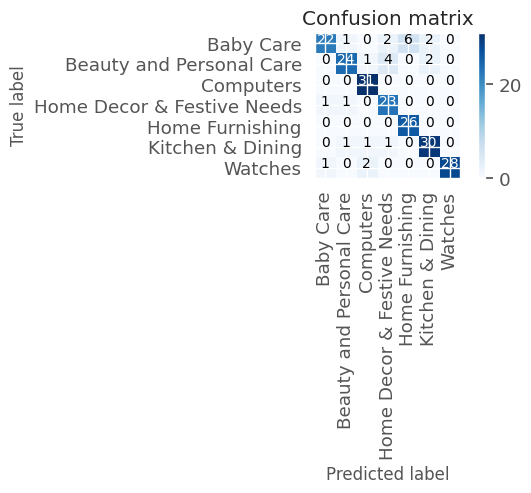

In [379]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay

accuracy=accuracy_score(y_test,y_pred)
print("accuracy: %0.3f" % accuracy)

cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes=pd.get_dummies(data['cat_lvl_1']).columns)

#### Classifieur - MLP

In [380]:
from sklearn.neural_network import MLPClassifier
#MLP_CLASSIFIER
mlp_clf = MLPClassifier(solver='lbfgs', alpha=1e-4,hidden_layer_sizes=(20,10, 2), random_state=42)

# Training model
mlp_clf = mlp_clf.fit(X_train.values,y_train)

# Predicting on the test set
y_pred=mlp_clf.predict(X_test.values)

# Calculating accuracy
accuracy = accuracy_score(y_test, y_pred)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [381]:
accuracy

0.6714285714285714

In [382]:
results_df.at["MLP" , "word2vec"] = accuracy
results_df

,countVectorizer,Tf-IDF,TF-IDF,word2vec
NB,0.852381,0.904762,NaN,NaN
RF,0.919048,NaN,NaN,0.876190
MLP,0.109524,NaN,0.109524,0.671429
GB,NaN,NaN,NaN,0.709524


### Bert

In [383]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 42.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 43.6 MB/s eta 0:00:00


In [384]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import shutil
import sys
# from transformers import DistilBertTokenizer
# from transformers import TFDistilBertForSequenceClassification
# from transformers import TextClassificationPipeline

In [385]:
df=data['description']
df.shape

(1050,)

In [386]:
labels=data['cat_lvl_1']
labels.value_counts()

Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: cat_lvl_1, dtype: int64

In [387]:
labels_df=pd.get_dummies(labels).astype(int)
labels_df.head()

,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
0,0,0,0,0,1,0,0
1,1,0,0,0,0,0,0
2,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0
4,0,0,0,0,1,0,0


In [388]:
labels_df.shape

(1050, 7)

In [389]:
frames = [df, labels_df]

In [390]:
df_tlabel = pd.concat(frames, axis=1, join="inner")
df_tlabel.isna().sum()
df_tlabel.shape
df_tlabel.head()

,description,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
0,Key Features of Elegance Polyester Multicolor ...,0,0,0,0,1,0,0
1,Specifications of Sathiyas Cotton Bath Towel (...,1,0,0,0,0,0,0
2,Key Features of Eurospa Cotton Terry Face Towe...,1,0,0,0,0,0,0
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,0,0,0,0,1,0,0
4,Key Features of Jaipur Print Cotton Floral Kin...,0,0,0,0,1,0,0


In [391]:
target_list = ['Beauty and Personal Care' ,	'Computers' ,	'Home Decor & Festive Needs' ,	'Home Furnishing' ,	'Kitchen & Dining'	, 'Watches']

In [392]:
#hyperparams mentioned in huggingface
MAX_LEN = 256
TRAIN_BATCH_SIZE = 5
VALID_BATCH_SIZE = 5
EPOCHS = 5
LEARNING_RATE = 1e-05

In [393]:
from transformers import BertTokenizer, BertModel
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [394]:
class CustomDataset(torch.utils.data.Dataset):

    def __init__(self, df, tokenizer, max_len):
        self.tokenizer = tokenizer
        self.df = df
        self.title = df['description']
        self.targets = self.df[target_list].values
        self.max_len = max_len

    def __len__(self):
        return len(self.title)

    def __getitem__(self, index):
        title = str(self.title[index])
        title = " ".join(title.split())

        inputs = self.tokenizer.encode_plus(
            title,
            None,
            add_special_tokens=True,
            max_length=self.max_len,
            padding='max_length',
            return_token_type_ids=True,
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt'
        )

        return {
            'input_ids': inputs['input_ids'].flatten(),
            'attention_mask': inputs['attention_mask'].flatten(),
            'token_type_ids': inputs["token_type_ids"].flatten(),
            'targets': torch.FloatTensor(self.targets[index])
        }


In [395]:
def split_train_val_test(data,train_size,random_state):
  #split train test
  from sklearn.model_selection import train_test_split

  train_df, val_test_df = train_test_split(data,
                                      test_size=(1-train_size),
                                      random_state=42)
  val_df, test_df = train_test_split(val_test_df,
                                      test_size=0.5,
                                      random_state=42)
  return train_df.reset_index(drop=True), val_df.reset_index(drop=True), test_df.reset_index(drop=True)

In [396]:
 train_df, val_df, test_df = split_train_val_test(df_tlabel,train_size=0.8,random_state=42)

In [397]:
train_df.shape

(840, 8)

In [398]:
#  # Diviser le jeux de donnes en test, train et val
#  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

#  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

In [399]:
train_df

,description,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
0,Timewel 1100-N1192 Analog Watch - For Men - B...,0,0,0,0,0,0,1
1,Ech oly Ceramic Inside Fitting Hookah Mouth Ti...,0,0,0,1,0,0,0
2,Buy Lapguard HP Pavilion DV7-6000 Series 6 Cel...,0,0,1,0,0,0,0
3,"Key Features of Smartpro 19.5v,3.9a Replacemen...",0,0,1,0,0,0,0
4,Key Features of Ville Style Polyester Maroon F...,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...
835,Buy Asus RT-N12 LX 300Mbps Wireless Router onl...,0,0,1,0,0,0,0
836,Key Features of Shaun Printed Baby Boy's Yello...,1,0,0,0,0,0,0
837,Specifications of Toffyhouse Baby Boy's Sleeps...,1,0,0,0,0,0,0
838,Buy Wallmantra Medium Vinyl Stickers Sticker f...,1,0,0,0,0,0,0


In [400]:
train_dataset = CustomDataset(train_df, tokenizer, MAX_LEN)
valid_dataset = CustomDataset(val_df, tokenizer, MAX_LEN)
test_dataset = CustomDataset(test_df, tokenizer, MAX_LEN)

In [401]:
train_data_loader = torch.utils.data.DataLoader(train_dataset,
    batch_size=TRAIN_BATCH_SIZE,
    shuffle=True,
    num_workers=0
)

val_data_loader = torch.utils.data.DataLoader(valid_dataset,
    batch_size=VALID_BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

test_data_loader = torch.utils.data.DataLoader(test_dataset,
    batch_size=VALID_BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

In [402]:
# specify the type of device used, GPU if available. I'm using TPU, but this model do't run well in TPU in colab, error under investigation
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [403]:
device

device(type='cpu')

In [404]:
def load_ckp(checkpoint_fpath, model, optimizer):
    """
    checkpoint_path: path to save checkpoint
    model: model that we want to load checkpoint parameters into
    optimizer: optimizer we defined in previous training
    """
    # load check point
    checkpoint = torch.load(checkpoint_fpath)
    # initialize state_dict from checkpoint to model
    model.load_state_dict(checkpoint['state_dict'])
    # initialize optimizer from checkpoint to optimizer
    optimizer.load_state_dict(checkpoint['optimizer'])
    # initialize valid_loss_min from checkpoint to valid_loss_min
    valid_loss_min = checkpoint['valid_loss_min']
    # return model, optimizer, epoch value, min validation loss
    return model, optimizer, checkpoint['epoch'], valid_loss_min.item()

def save_ckp(state, is_best, checkpoint_path, best_model_path):
    """
    state: checkpoint we want to save
    is_best: is this the best checkpoint; min validation loss
    checkpoint_path: path to save checkpoint
    best_model_path: path to save best model
    """
    f_path = checkpoint_path
    # save checkpoint data to the path given, checkpoint_path
    torch.save(state, f_path)
    # if it is a best model, min validation loss
    if is_best:
        best_fpath = best_model_path
        # copy that checkpoint file to best path given, best_model_path
        shutil.copyfile(f_path, best_fpath)

In [405]:
train_df.shape

(840, 8)

In [406]:

class BERTClass(torch.nn.Module):
    def __init__(self):
        super(BERTClass, self).__init__()
        self.bert_model = BertModel.from_pretrained('bert-base-uncased', return_dict=True)
        self.dropout = torch.nn.Dropout(0.3)
        self.linear = torch.nn.Linear(768, 6) # Bert output layer has dimention 768 and output will be 6 classes

    def forward(self, input_ids, attn_mask, token_type_ids):
        output = self.bert_model(
            input_ids,
            attention_mask=attn_mask,
            token_type_ids=token_type_ids
        )
        output_dropout = self.dropout(output.pooler_output)
        output = self.linear(output_dropout)
        return output

model = BERTClass()
model.to(device)

BERTClass(
  (bert_model): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_a

In [407]:
def loss_fn(outputs, targets):
    return torch.nn.BCEWithLogitsLoss()(outputs, targets)

optimizer = torch.optim.Adam(params =  model.parameters(), lr=LEARNING_RATE)

In [408]:
val_targets=[]
val_outputs=[]

In [409]:
def train_model(n_epochs, training_loader, validation_loader, model,
                optimizer, checkpoint_path, best_model_path):

  # initialize tracker for minimum validation loss
  valid_loss_min = np.Inf


  for epoch in range(1, n_epochs+1):
    train_loss = 0
    valid_loss = 0

    model.train()
    print('############# Epoch {}: Training Start   #############'.format(epoch))
    for batch_idx, data in enumerate(training_loader):
        #print('yyy epoch', batch_idx)
        ids = data['input_ids'].to(device, dtype = torch.long)
        mask = data['attention_mask'].to(device, dtype = torch.long)
        token_type_ids = data['token_type_ids'].to(device, dtype = torch.long)
        targets = data['targets'].to(device, dtype = torch.float)

        outputs = model(ids, mask, token_type_ids)

        optimizer.zero_grad()
        loss = loss_fn(outputs, targets)
        #if batch_idx%5000==0:
         #   print(f'Epoch: {epoch}, Training Loss:  {loss.item()}')

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        #print('before loss data in training', loss.item(), train_loss)
        train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.item() - train_loss))
        #print('after loss data in training', loss.item(), train_loss)

    print('############# Epoch {}: Training End     #############'.format(epoch))

    print('############# Epoch {}: Validation Start   #############'.format(epoch))
    ######################
    # validate the model #
    ######################

    model.eval()

    with torch.no_grad():
      for batch_idx, data in enumerate(validation_loader, 0):
            ids = data['input_ids'].to(device, dtype = torch.long)
            mask = data['attention_mask'].to(device, dtype = torch.long)
            token_type_ids = data['token_type_ids'].to(device, dtype = torch.long)
            targets = data['targets'].to(device, dtype = torch.float)
            outputs = model(ids, mask, token_type_ids)

            loss = loss_fn(outputs, targets)
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.item() - valid_loss))
            val_targets.extend(targets.cpu().detach().numpy().tolist())
            val_outputs.extend(torch.sigmoid(outputs).cpu().detach().numpy().tolist())

      print('############# Epoch {}: Validation End     #############'.format(epoch))
      # calculate average losses
      #print('before cal avg train loss', train_loss)
      train_loss = train_loss/len(training_loader)
      valid_loss = valid_loss/len(validation_loader)
      # print training/validation statistics
      print('Epoch: {} \tAvgerage Training Loss: {:.6f} \tAverage Validation Loss: {:.6f}'.format(
            epoch,
            train_loss,
            valid_loss
            ))

      # create checkpoint variable and add important data
      checkpoint = {
            'epoch': epoch + 1,
            'valid_loss_min': valid_loss,
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict()
      }

        # save checkpoint
      save_ckp(checkpoint, False, checkpoint_path, best_model_path)

      ## : save the model if validation loss has decreased
      if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min,valid_loss))
        # save checkpoint as best model
        save_ckp(checkpoint, True, checkpoint_path, best_model_path)
        valid_loss_min = valid_loss

    print('############# Epoch {}  Done   #############\n'.format(epoch))

  return model

In [410]:
EPOCHS

5

In [411]:
train_data_loader

In [412]:
val_data_loader

In [413]:
optimizer

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 1e-05
    maximize: False
    weight_decay: 0
)

In [414]:
trained_model = train_model(EPOCHS, train_data_loader, val_data_loader, model, optimizer, "/curr_ckpt", '/best.pt')

############# Epoch 1: Training Start   #############
############# Epoch 1: Training End     #############
############# Epoch 1: Validation Start   #############
############# Epoch 1: Validation End     #############
Epoch: 1 	Avgerage Training Loss: 0.002448 	Average Validation Loss: 0.014537
Validation loss decreased (inf --> 0.014537).  Saving model ...
############# Epoch 1  Done   #############

############# Epoch 2: Training Start   #############
############# Epoch 2: Training End     #############
############# Epoch 2: Validation Start   #############
############# Epoch 2: Validation End     #############
Epoch: 2 	Avgerage Training Loss: 0.001448 	Average Validation Loss: 0.008291
Validation loss decreased (0.014537 --> 0.008291).  Saving model ...
############# Epoch 2  Done   #############

############# Epoch 3: Training Start   #############
############# Epoch 3: Training End     #############
############# Epoch 3: Validation Start   #############
############# Epo

In [415]:
example = val_df['description'][0]
example

'Surface180 Wonderful Wooden Antique Drawer Box Showpiece  -  20 cm (Wooden, Green)\r\n                         Price: Rs. 1,112\r\n\t\t\t\t\r\n\t\t\tThe vibrant antique drawer Box looks astonishing with alluring carvings and bright colors. Featuring body dimensions of 13 (L) x 10 (W) x 18 (H) cms, it is indeed an amazing home decorative item. The small and compact wooden antique style Box has different golden carvings on each front panel of the drawer and around the drawer Box , which makes it fascinating.\r\n\r\nNote: This is Handcraft Item so each item will be different than other due to limitation of photography.\r\nThe vibrant antique drawer Box looks astonishing with alluring carvings and bright colors. Featuring body dimensions of 13 (L) x 10 (W) x 18 (H) cms, it is indeed an amazing home decorative item. The small and compact wooden antique style Box has different golden carvings on each front panel of the drawer and around the drawer Box , which makes it fascinating.\r\n\r\nNo

#### Validation of Bert model

In [416]:
# testing
example = test_df['description'][0]
encodings = tokenizer.encode_plus(
    example,
    None,
    add_special_tokens=True,
    max_length=MAX_LEN,
    padding='max_length',
    return_token_type_ids=True,
    truncation=True,
    return_attention_mask=True,
    return_tensors='pt'
)
model.eval()

with torch.no_grad():
    input_ids = encodings['input_ids'].to(device, dtype=torch.long)
    attention_mask = encodings['attention_mask'].to(device, dtype=torch.long)
    token_type_ids = encodings['token_type_ids'].to(device, dtype=torch.long)
    output = trained_model(input_ids, attention_mask, token_type_ids)
    final_output = torch.sigmoid(output).cpu().detach().numpy().tolist()
    # Get the indices of columns with maximum values for each row in final_output
    max_indices = np.argmax(final_output, axis=1)
    # Extract the column names using the indices
    selected_columns = train_df.columns[1:][max_indices]
    print(final_output)
    print(selected_columns)

    # print(train_df.columns[1:].to_list()[int(np.argmax(final_output, axis=1))])


[[0.048524174839258194, 0.04695308580994606, 0.05014777183532715, 0.0483090877532959, 0.9017722010612488, 0.04221342131495476]]
Index(['Home Furnishing'], dtype='object')


### USE(Universal Sentence Encoder)

In [417]:
import tensorflow as tf
import tensorflow_hub as hub
from sklearn import preprocessing
import numpy as np
import keras

In [419]:
# Get embeddings for the sentences

messages = data['description'].tolist()
x = messages


In [420]:
y = data['cat_lvl_1'].tolist()

In [421]:
# convert labels into vectors
le = preprocessing.LabelEncoder()
le.fit(y)
le.classes_


array(['Baby Care', 'Beauty and Personal Care', 'Computers',
       'Home Decor & Festive Needs', 'Home Furnishing',
       'Kitchen & Dining', 'Watches'], dtype='<U26')

In [422]:
# encode will transform the classes into numbers
def encode(le,labels):
  enc = le.transform(labels)
  # transfer the numbers into one hot vectors
  return keras.utils.to_categorical(enc)

# decode will take the onehot vectors, uses the np argmax that will convert a vector to the index of his hights value
def decode (le, one_hot):
    # Ensure one_hot is a 1D array
    if one_hot.ndim == 0:
        one_hot = np.expand_dims(one_hot, axis=0)

    dec = np.argmax(one_hot, axis=1)
    # Decode back into text
    return le.inverse_transform(dec)

In [423]:
test = encode(le, ['Baby Care', 'Beauty and Personal Care', 'Computers', 'Home Decor & Festive Needs', 'Home Furnishing', 'Kitchen & Dining', 'Watches'])
test

array([[1., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 1.]], dtype=float32)

In [424]:
untest = decode(le, test)
untest

array(['Baby Care', 'Beauty and Personal Care', 'Computers',
       'Home Decor & Festive Needs', 'Home Furnishing',
       'Kitchen & Dining', 'Watches'], dtype='<U26')

In [425]:
# we have 1050 samples, I will train in 800 and test in 250
y_enc = encode(le, y)

x_train = np.asarray(x[:800])
y_train = np.asarray(y_enc[:800])

x_test = np.asarray(x[800:])
y_test = np.asarray(y_enc[800:])

In [427]:
# Create a custom Keras layer for the Universal Sentence Encoder
class UniversalEmbeddingLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        self.dimensions = 512
        super(UniversalEmbeddingLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        self.embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
        super(UniversalEmbeddingLayer, self).build(input_shape)

    def call(self, x):
        return self.embed(tf.squeeze(tf.cast(x, tf.string)))

    def compute_output_shape(self, input_shape):
        return input_shape[0], self.dimensions

In [428]:
# pip install --upgrade tensorflow tensorflow-hub keras

In [429]:
# Input layer for the test data
input_test = tf.keras.layers.Input(shape=(1,), dtype=tf.string)

# Embedding layer using the custom UniversalEmbeddingLayer
embedding = UniversalEmbeddingLayer()(input_test)

# Dense layer with 256 neurons and ReLU activation
dense = tf.keras.layers.Dense(256, activation='relu')(embedding)

# Output layer with 7 neurons and softmax activation for multi-class classification
pred = tf.keras.layers.Dense(7, activation='softmax')(dense)

# Create the model in graph mode
model = tf.keras.models.Model(inputs=[input_test], outputs=pred)

# Compile the model with categorical_crossentropy loss and Adam optimizer
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [430]:
# # Create a new TensorFlow session
# sess = tf.compat.v1.Session()
# tf.compat.v1.keras.backend.set_session(sess)

# # Initialize the global variables and tables
# sess.run(tf.compat.v1.global_variables_initializer())
# sess.run(tf.compat.v1.tables_initializer())

# Fit the model
history = model.fit(x_train, y_train, epochs=3, batch_size=5)

# Save the model weights
model.save_weights('./model.h5')

Epoch 1/3
160/160 [==============================] - 5s 6ms/step - loss: 1.1113 - accuracy: 0.7387
Epoch 2/3
160/160 [==============================] - 1s 6ms/step - loss: 0.3089 - accuracy: 0.9438
Epoch 3/3
160/160 [==============================] - 1s 6ms/step - loss: 0.1585 - accuracy: 0.9688


In [431]:
# # Create a new TensorFlow session
# sess = tf.compat.v1.Session()
# tf.compat.v1.keras.backend.set_session(sess)

# # Initialize the global variables and tables
# sess.run(tf.compat.v1.global_variables_initializer())
# sess.run(tf.compat.v1.tables_initializer())

model.load_weights('./model.h5')
predicts = model.predict(x_test, batch_size=5)


50/50 [==============================] - 1s 5ms/step


In [432]:
y_test = decode(le, y_test)
y_preds = decode(le, predicts)

##### Validation of USE model

In [433]:
from sklearn import metrics

In [434]:
y=np.where(np.array(pd.get_dummies(data['cat_lvl_1']))==1)[1]
y

array([4, 0, 0, ..., 0, 0, 0])

In [435]:
# Calculate metrics
metrics.confusion_matrix(y_test, y_preds)

array([[24,  2,  0,  3,  4,  9,  0],
       [ 2, 25,  0,  0,  0,  2,  0],
       [ 0,  0, 45,  0,  0,  5,  0],
       [ 0,  0,  4, 28,  3,  6,  0],
       [17,  1,  0,  0, 55,  0,  0],
       [ 0,  0,  0,  0,  0, 11,  0],
       [ 0,  1,  0,  0,  0,  0,  3]])

In [436]:
print(metrics.classification_report(y_test, y_preds))


                            precision    recall  f1-score   support

                 Baby Care       0.56      0.57      0.56        42
  Beauty and Personal Care       0.86      0.86      0.86        29
                 Computers       0.92      0.90      0.91        50
Home Decor & Festive Needs       0.90      0.68      0.78        41
           Home Furnishing       0.89      0.75      0.81        73
          Kitchen & Dining       0.33      1.00      0.50        11
                   Watches       1.00      0.75      0.86         4

                  accuracy                           0.76       250
                 macro avg       0.78      0.79      0.76       250
              weighted avg       0.82      0.76      0.78       250



accuracy: 0.764
Confusion matrix, without normalization


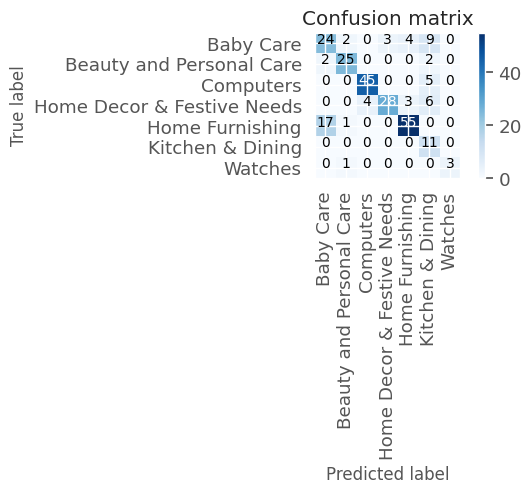

In [437]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay

accuracy=accuracy_score(y_test,y_preds)
print("accuracy: %0.3f" % accuracy)

cm = metrics.confusion_matrix(y_test, y_preds)
plot_confusion_matrix(cm, classes=pd.get_dummies(data['cat_lvl_1']).columns)